<a href="https://colab.research.google.com/github/SindhiyaSridharan/Bank_Loan/blob/master/Loan_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Project done by Sindhiya Sridharan**

**Problem Statement: To build different classification models  to predict the likelihood of a liability customer buying personal loan.**


Given Dataset Description: The file Bank.xls contains data on 5000 customers. The data includes customer demographic information (age, income, etc.), the customer's relationship with the bank (mortgage, securities account, etc.), and the customer response to the last personal loan campaign (Personal Loan).
Among these 5000 customers, only 480 (= 9.6%) accepted the personal loan that was offered to them in the earlier campaign.


In [ ]:
#Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
#Importing Dataset
df=pd.read_excel('/content/Bank.xlsx', sheet_name= 'Data')
df.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [ ]:
#Renaming certain columns
df=df.rename(columns={'Personal Loan': 'PersonalLoan', 'Securities Account': 'SecuritiesAccount', 'CD Account': 'CDAccount'})
df.head()

,Age,Income,Family,CCAvg,Education,Mortgage,PersonalLoan,SecuritiesAccount,CDAccount,Online,CreditCard
0,25,6.827583,4,0.845150,1,-0.0,0,1,0,0,0
1,45,5.876952,3,0.814468,1,-0.0,0,1,0,0,0
2,39,3.504287,1,0.633771,1,-0.0,0,0,0,0,0
3,35,8.983393,1,1.107409,2,-0.0,0,0,0,0,0
4,35,6.597314,4,0.633771,2,-0.0,0,0,0,0,1


**1) Checking datatype, Statistical Summary, Shape, Null Values etc**

In [ ]:
#Checking the datatype
df.dtypes

ID                     int64
Age                    int64
Experience             int64
Income                 int64
ZIP Code               int64
Family                 int64
CCAvg                float64
Education              int64
Mortgage               int64
PersonalLoan           int64
SecuritiesAccount      int64
CDAccount              int64
Online                 int64
CreditCard             int64
dtype: object

In [ ]:
#Statstical Summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937913,1.747666,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
PersonalLoan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


In [ ]:
#Shape of the DataFrame
df.shape

(5000, 14)

In [ ]:
#Null value Analysis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 5000 non-null   int64  
 1   Age                5000 non-null   int64  
 2   Experience         5000 non-null   int64  
 3   Income             5000 non-null   int64  
 4   ZIP Code           5000 non-null   int64  
 5   Family             5000 non-null   int64  
 6   CCAvg              5000 non-null   float64
 7   Education          5000 non-null   int64  
 8   Mortgage           5000 non-null   int64  
 9   PersonalLoan       5000 non-null   int64  
 10  SecuritiesAccount  5000 non-null   int64  
 11  CDAccount          5000 non-null   int64  
 12  Online             5000 non-null   int64  
 13  CreditCard         5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [ ]:
#Summarising Missing Values
df.isnull().sum()

ID                   0
Age                  0
Experience           0
Income               0
ZIP Code             0
Family               0
CCAvg                0
Education            0
Mortgage             0
PersonalLoan         0
SecuritiesAccount    0
CDAccount            0
Online               0
CreditCard           0
dtype: int64


Observation : No Missing Values

**2) Check if you need to clean the data for any of the variables**

In [ ]:
#Total no. of Negative values
sum(n < 0 for n in df.values.flatten())

52

As mentioned in the statstical summary , Experience column holds a minimum value of -3. 

In [ ]:
#count of negative values form Experience coulmn
df[df['Experience'] < 0]['Experience'].count()

52

The total no. of negative values = No. of Negtaive values in Experience.

Observation : Experience column is the only contributor of Negative Values and it requires a clean up.

**3) EDA: Study of the data distribution in each attribute/feature variable and target variable.**

In [ ]:
#Number of unique in each column
df.nunique()

ID                   5000
Age                    45
Experience             47
Income                162
ZIP Code              467
Family                  4
CCAvg                 108
Education               3
Mortgage              347
PersonalLoan            2
SecuritiesAccount       2
CDAccount               2
Online                  2
CreditCard              2
dtype: int64

In [ ]:
#Number of people with zero mortgage
df.Mortgage.isin([0]).sum()

3462

In [ ]:
#Number of people with zero credit card spending per month
df.CCAvg.isin([0]).sum()

106

In [ ]:
#Value counts of all categorical columns
for col in df:
    print("-"*60 + col + "-"*60)
    display(df[col].value_counts().head(4))

------------------------------------------------------------Age------------------------------------------------------------


35    151
43    149
52    145
58    143
Name: Age, dtype: int64

------------------------------------------------------------Income------------------------------------------------------------


6.537451    85
6.156024    84
8.302424    83
6.351766    82
Name: Income, dtype: int64

------------------------------------------------------------Family------------------------------------------------------------


1    1472
2    1296
4    1222
3    1010
Name: Family, dtype: int64

------------------------------------------------------------CCAvg------------------------------------------------------------


0.253538    241
0.633771    231
0.178029    204
0.954454    188
Name: CCAvg, dtype: int64

------------------------------------------------------------Education------------------------------------------------------------


1    2096
3    1501
2    1403
Name: Education, dtype: int64

------------------------------------------------------------Mortgage------------------------------------------------------------


-0.000000    3462
 1.801504      17
 1.793965      16
 1.791652      16
Name: Mortgage, dtype: int64

------------------------------------------------------------PersonalLoan------------------------------------------------------------


0    4520
1     480
Name: PersonalLoan, dtype: int64

------------------------------------------------------------SecuritiesAccount------------------------------------------------------------


0    4478
1     522
Name: SecuritiesAccount, dtype: int64

------------------------------------------------------------CDAccount------------------------------------------------------------


0    4698
1     302
Name: CDAccount, dtype: int64

------------------------------------------------------------Online------------------------------------------------------------


1    2984
0    2016
Name: Online, dtype: int64

------------------------------------------------------------CreditCard------------------------------------------------------------


0    3530
1    1470
Name: CreditCard, dtype: int64

The dataset consists of,

(a) Numerical Variables:  ‘ID’, 'Age’, ‘Experience’, ‘Income’, ‘ZIP Code’, ‘CCAvg’,  ‘Mortgage’

(b) Ordinal Variables (Categorical Variables): ‘Family’, ‘Education’

(c) Nominal Variables (Categorical Variables):   ‘Personal Loan’, ‘Securities Account’,  ‘CD Account’, ‘Online’, ‘Credit Card’

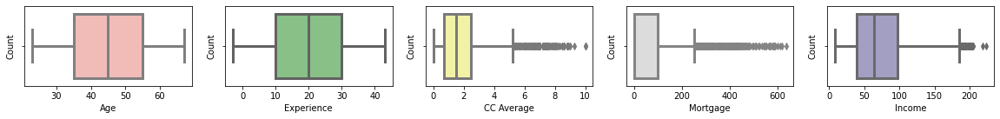

Text(0, 0.5, 'Count')

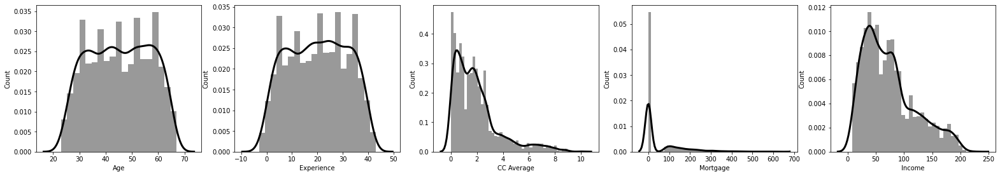

In [ ]:
# Numerical Variables (Univariant Analysis)

plt.figure(figsize= (20,20))
plt.subplot(10,5,1)
sns.boxplot(x= df.Age, palette= 'Pastel1')
plt.xlabel ('Age')
plt.ylabel ('Count')

plt.subplot(10,5,2)
sns.boxplot(x= df.Experience, palette= 'Accent')
plt.xlabel ('Experience')
plt.ylabel ('Count')

plt.subplot(10,5,3)
sns.boxplot(x= df.CCAvg, palette= 'Accent_r')
plt.xlabel ('CC Average')
plt.ylabel ('Count')

plt.subplot(10,5,4)
sns.boxplot(x= df.Mortgage, palette= 'coolwarm')
plt.xlabel ('Mortgage')
plt.ylabel ('Count')

plt.subplot(10,5,5)
sns.boxplot(x= df.Income, palette= 'Purples')
plt.xlabel ('Income')
plt.ylabel ('Count')
plt.show()

plt.figure(figsize= (27,50))
plt.subplot(10,5,6)
sns.distplot(df.Age,color='black')
plt.xlabel ('Age', fontsize=10)
plt.ylabel ('Count',fontsize=10)

plt.subplot(10,5,7)
sns.distplot(df.Experience,color='black')
plt.xlabel ('Experience',fontsize=10)
plt.ylabel ('Count',fontsize=10)

plt.subplot(10,5,8)
sns.distplot(df.CCAvg,color='black')
plt.xlabel ('CC Average',fontsize=10)
plt.ylabel ('Count',fontsize=10)

plt.subplot(10,5,9)
sns.distplot(df.Mortgage,color='black')
plt.xlabel ('Mortgage',fontsize=10)
plt.ylabel ('Count',fontsize=10)

plt.subplot(10,5,10)
sns.distplot(df.Income, color='black')
plt.xlabel ('Income',fontsize=10)
plt.ylabel ('Count',fontsize=10)


From the above graphs of boxplot and distplot, we could observe a normal distribution of Age and Experience. In contradiction to that, CC Average, Mortgage tend to exhibit positive skewness while Income displays slightly less positive skewness . 

In [ ]:
#Checking the level of Skewness and Kurtosis
import statsmodels.api as sm
import scipy.stats as stats
Skewness = pd.DataFrame({'Skewness' : [stats.skew(df.Age),stats.skew(df.Experience),stats.skew(df.Income),stats.skew(df.CCAvg)
                                      ,stats.skew(df.Mortgage)]},index=['Age','Experience','Income','CCAvg','Mortgage'])
Skewness

Kurtosis = pd.DataFrame({'Kurtosis' : [stats.kurtosis(df.Age),stats.kurtosis(df.Experience),stats.kurtosis(df.Income),stats.kurtosis(df.CCAvg)
                                      ,stats.kurtosis(df.Mortgage)]},index=['Age','Experience','Income','CCAvg','Mortgage'])

ND_check=pd.concat([Skewness,Kurtosis],axis=1)
ND_check


,Skewness,Kurtosis
Age,-0.029332,-1.153114
Experience,-0.026317,-1.121601
Income,0.841086,-0.045400
CCAvg,1.597977,2.642845
Mortgage,2.103371,4.750841


If skewness is between -1 and 1, the distribution is considered normal. An approximately symmetric distribution occurs when the skewness falls between -0.5 to 0.5.

The estimated values of  skewness  substantiate the graphical representation.

As kurtosis indicate the presence of outliers, the higher values represent high presence of outliers and lower values represents the lesser no. of outliners. The acceptable range of kurtosis is between -3 to 3.

The Kurtosis Analysis indicate the presence of outliers highly in Mortgage.





Text(0.5, 1.0, 'Distribution of Credit Card')

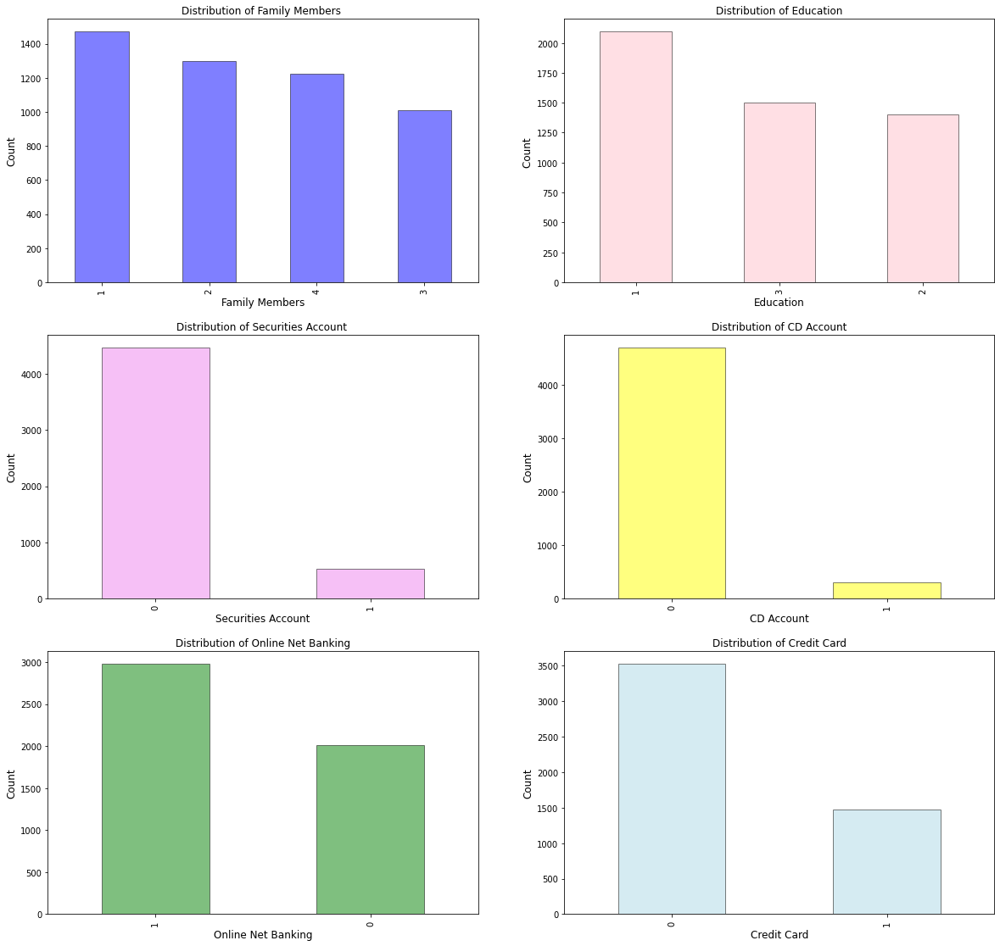

In [ ]:
# Categorical Variables (Univariant Analysis)
plt.figure(figsize= (20,40))
plt.subplot(6,2,1)
df.Family.value_counts().plot(kind="bar", align='center',color = 'blue',edgecolor = 'black', alpha=0.5)
plt.xlabel("Family Members",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.title("Distribution of Family Members ")


plt.subplot(6,2,2)
df.Education.value_counts().plot(kind="bar", align='center',color = 'pink',edgecolor = 'black',alpha=0.5)
plt.xlabel('Education',fontsize=12)
plt.ylabel('Count ',fontsize=12)
plt.title('Distribution of Education')


plt.subplot(6,2,3)
df.SecuritiesAccount.value_counts().plot(kind="bar", align='center',color = 'violet',edgecolor = 'black',alpha=0.5)
plt.xlabel('Securities Account',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.title('Distribution of Securities Account ')


plt.subplot(6,2,4)
df.CDAccount.value_counts().plot(kind="bar", align='center',color = 'yellow',edgecolor = 'black',alpha=0.5)
plt.xlabel('CD Account',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.title("Distribution of CD Account")


plt.subplot(6,2,5)
df.Online.value_counts().plot(kind="bar", align='center',color = 'green',edgecolor = 'black',alpha=0.5)
plt.xlabel('Online Net Banking',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.title("Distribution of Online Net Banking")

plt.subplot(6,2,6)
df.CreditCard.value_counts().plot(kind="bar", align='center',color = 'lightblue',edgecolor = 'black', alpha=0.5)
plt.xlabel('Credit Card',fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title("Distribution of Credit Card")

From the above Bar graphs, High no. of members belong to Education level 1 and Family consisting of 1 individual. Similarly, more members do not hold Securities Account, Credit Card and CD Account. High no. of Members of this bank use online net banking.

Comparing the value counts of each of these categorical columns, we can corroborate above mentioned observation. Education level 1 = 41.92% , Family level 1 = 29.44%, No Securities Account = 89.56% , No Credit Card = 70.6% , No CD Account = 93.96% and Usage of Online Net Banking = 59.68%


Text(0.5, 1.0, 'Correlation Heat Map')

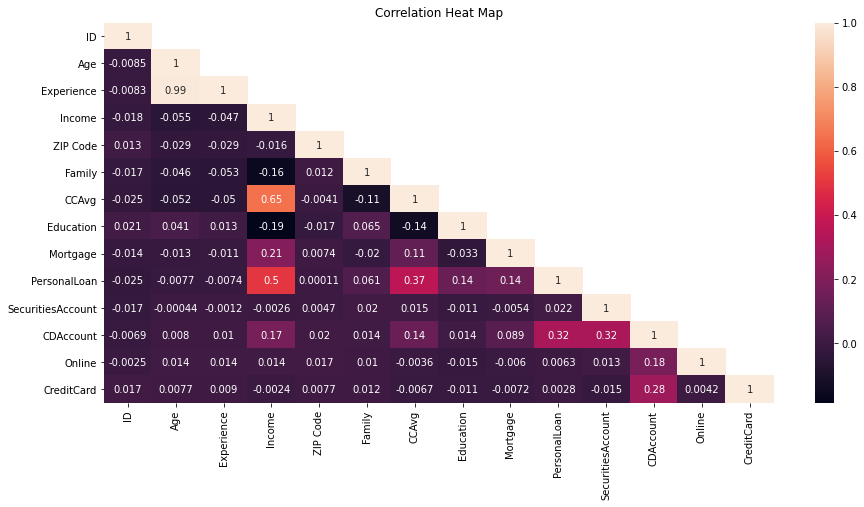

In [ ]:
# Correlation with heat map
import matplotlib.pyplot as plt
import seaborn as sns
corr = df.corr()
sns.set_context(font_scale=2.0, rc={"lines.linewidth": 3})
# To avoid repeatition of correlation values, a mask is created.
plt.figure(figsize=(15,7))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, 1)] = True
ht = sns.heatmap(corr,mask=mask, annot=True)
rotx = ht.set_xticklabels(ht.get_xticklabels(), rotation=90)
roty = ht.set_yticklabels(ht.get_yticklabels(), rotation=0)
plt.title(label="Correlation Heat Map")

From the heat map, we can conclude high correlation between Age and Experience.

CC Average and Income exhibits a fair level of correlation.

Income also indicates correlation with Personal Loan


Text(0.5, 0, 'Fig 6: Credit Card')

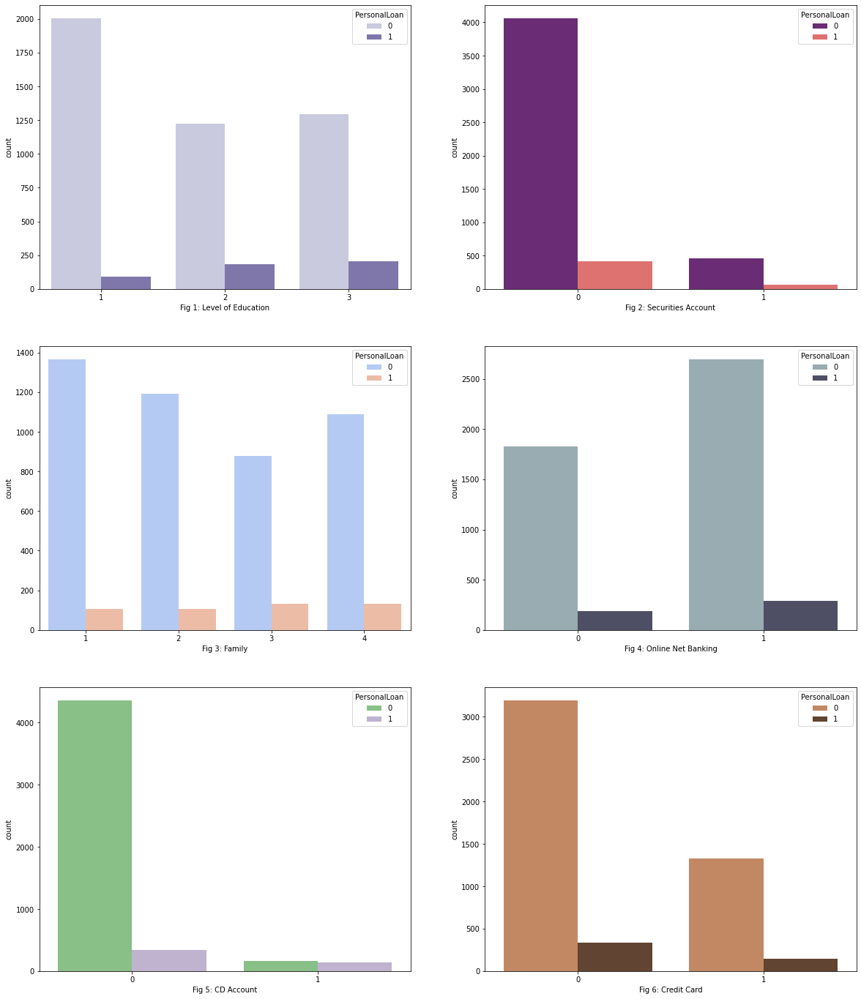

In [ ]:
#Bivariant Analysis
plt.figure(figsize= (20,50))
plt.subplot(6,2,1)
sns.countplot(x=df.Education,hue='PersonalLoan', data=df, palette= 'Purples')
plt.xlabel('Fig 1: Level of Education')

plt.subplot(6,2,2)
sns.countplot(x=df.SecuritiesAccount,hue='PersonalLoan', data=df, palette= 'magma')
plt.xlabel('Fig 2: Securities Account')

plt.subplot(6,2,3)
sns.countplot(x=df.Family,hue='PersonalLoan', data=df, palette= 'coolwarm')
plt.xlabel('Fig 3: Family')

plt.subplot(6,2,4)
sns.countplot(x=df.Online,hue='PersonalLoan', data=df, palette= 'bone_r')
plt.xlabel('Fig 4: Online Net Banking')

plt.subplot(6,2,5)
sns.countplot(x=df.CDAccount,hue='PersonalLoan', data=df, palette= 'Accent')
plt.xlabel('Fig 5: CD Account')

plt.subplot(6,2,6)
sns.countplot(x=df.CreditCard,hue='PersonalLoan', data=df, palette= 'copper_r')
plt.xlabel('Fig 6: Credit Card')


From the countplots listed above,

1) Rise in Education level indicates elevation of Personal Loan selection.

2) Members without Securities Account are prone to choosing Personal Loan.

3)Family with members 3 and 4 tend to choose Personal Loans more than Family members 1 and 2.

4) Members using Online Net Banking tend to take up Personal Loan.

5)Members without CD Account tend to take up Personal Loan.

6)Members without Credit Card take up Personal Loan.


Text(0.5, 1.0, 'Fig 4: Influence of Family and Income on Personal Loans ')

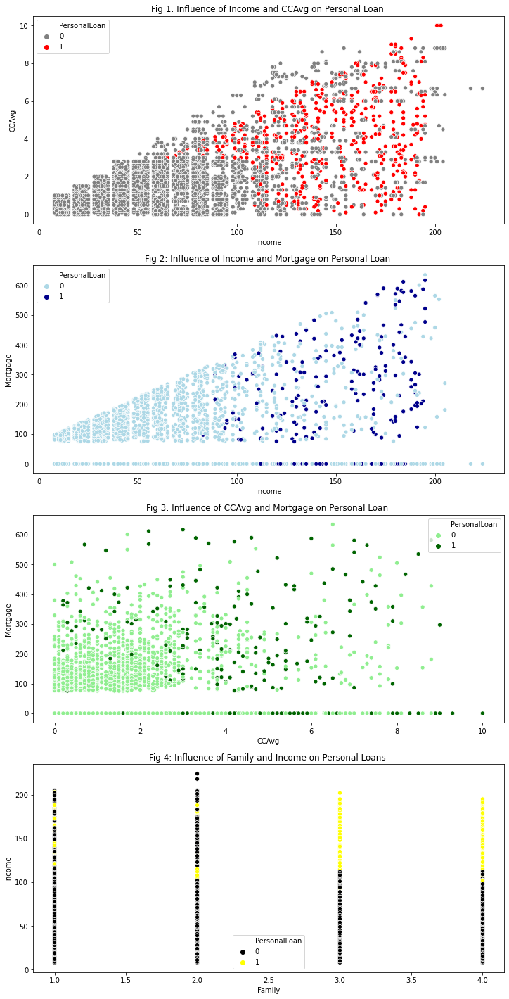

In [ ]:
#Multivariant Analysis

plt.figure(figsize=(12,25))

plt.subplot(4,1,1)
sns.scatterplot(df.Income, df.CCAvg, hue = df['PersonalLoan'], palette= ['grey','red'])
plt.title("Fig 1: Influence of Income and CCAvg on Personal Loan ")

plt.subplot(4,1,2)
sns.scatterplot(df.Income, df.Mortgage, hue = df['PersonalLoan'], palette= ['lightblue','darkblue'])
plt.title("Fig 2: Influence of Income and Mortgage on Personal Loan ")

plt.subplot(4,1,3)
sns.scatterplot(df.CCAvg, df.Mortgage, hue = df['PersonalLoan'], palette= ['lightgreen','darkgreen'])
plt.title("Fig 3: Influence of CCAvg and Mortgage on Personal Loan ")

plt.subplot(4,1,4)
sns.scatterplot(df.Family, df.Income, hue = df['PersonalLoan'], palette= ['black','yellow'])
plt.title("Fig 4: Influence of Family and Income on Personal Loans ")

From the scatterplots,

Fig 1: Mostly members with high income tend to have high CC Average. Considering this, High CC Average members take up more of Personal Loans.This also substantiates the above mentioned correlation of 'CCAvg' and 'Income'.

Fig 2: Members with Income higher than $100 have Mortgage and which in return increases the Personal Loan selection.

Fig 3: Members with CC Average between 3 to 7 and Income between 100 dollars to 400 dollars tend to choose Personal Loan.

Fig 4: As already mentioned, Family with members 3 and 4 choose Personal Loans and also members with income above 100 dollars take up Personal Loan.


Text(0.5, 1.0, 'Fig 4: Influence of Education and Mortgage on Personal Loan ')

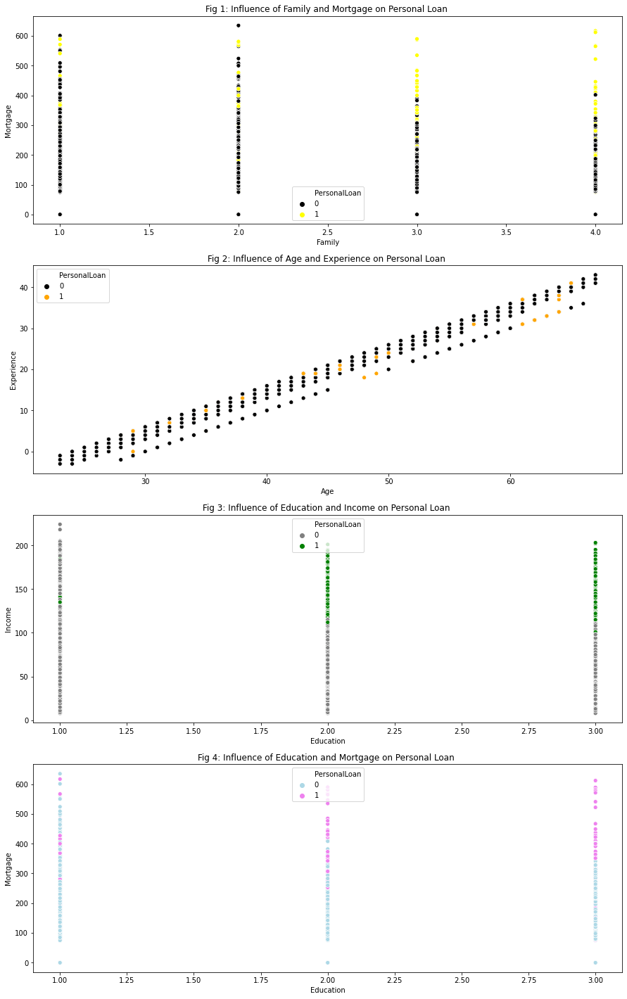

In [ ]:
#Multivariant Analysis
plt.figure(figsize=(15,25))

plt.subplot(4,1,1)
sns.scatterplot(df.Family, df.Mortgage, hue = df['PersonalLoan'], palette= ['black','yellow'])
plt.title("Fig 1: Influence of Family and Mortgage on Personal Loan ")

plt.subplot(4,1,2)
sns.scatterplot(df.Age, df.Experience, hue = df['PersonalLoan'], palette= ['black','orange'])
plt.title("Fig 2: Influence of Age and Experience on Personal Loan ")

plt.subplot(4,1,3)
sns.scatterplot(df.Education, df.Income, hue = df['PersonalLoan'], palette= ['grey','green'])
plt.title("Fig 3: Influence of Education and Income on Personal Loan ")

plt.subplot(4,1,4)
sns.scatterplot(df.Education, df.Mortgage, hue = df['PersonalLoan'], palette= ['lightblue','violet'])
plt.title("Fig 4: Influence of Education and Mortgage on Personal Loan ")

From the above scatterplots,

Fig 1: Members with Mortgage above 300 dollars prefer Personal Loans in all the four categories of family. Especially, Families consisting of 3 and 4 members and with Mortgage more than 300 dollars highly choose Personal Loan.

Fig 2: Age and Experience are highly correlated. They both don't influence Personal Loan.

Fig 3: Income and Education are not highly correlated, they tend to show same level of incomes for all the three Education levels. Members who belong to Level 2 "Graduate" and Level 3 "Advanced/Professional" with Income above $100 tend to take up Personal Loan.

Fig 4: Personal Loans are taken by members with Mortgage more than $300. To be precise, members under Education level 2 and 3 with Mortgage higher than 300 dollars tend to choose Personal Loan.


Text(0.5, 1.0, 'Fig 2: Distribution of Income')

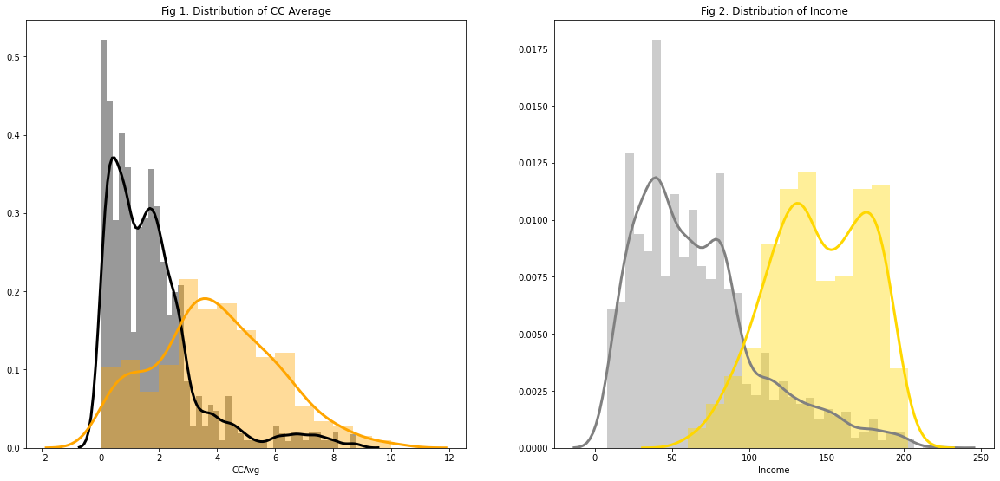

In [ ]:
#Bivariant Analysis
plt.figure(figsize= (20,20))
plt.subplot(2,2,1)
sns.distplot( df[df.PersonalLoan == 0]['CCAvg'], color = 'black')
sns.distplot( df[df.PersonalLoan == 1]['CCAvg'], color = 'orange')
plt.title("Fig 1: Distribution of CC Average")

plt.subplot(2,2,2)
sns.distplot( df[df.PersonalLoan == 0]['Income'], color = 'grey')
sns.distplot( df[df.PersonalLoan == 1]['Income'], color = 'gold')
plt.title("Fig 2: Distribution of Income")


From the distplots,

Fig 1: High CC Average displays high no. of Personal Loans

Fig 2: Increase in the Income indicates rise in Personal Loan.

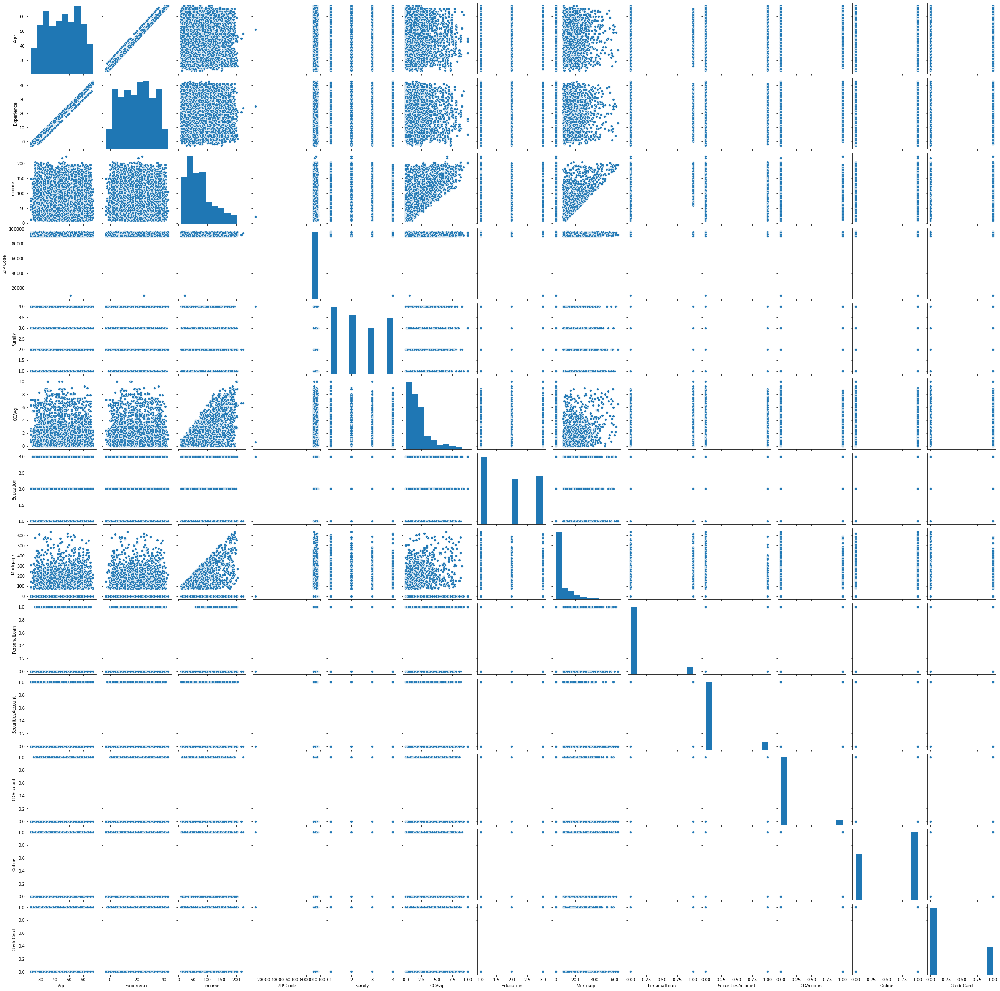

In [ ]:
sns.pairplot(df.iloc[:,1:])

**4) Transformations for the feature variables**

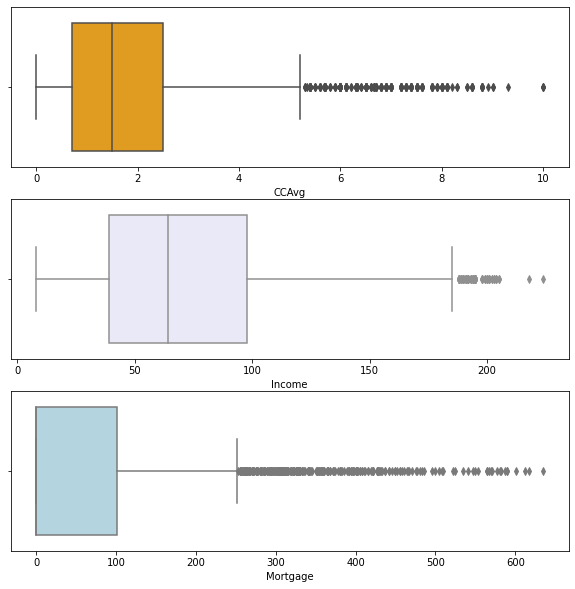

In [ ]:
#Before Transformation
plt.figure(figsize= (10,10))

#CC Average
plt.subplot(3,1,1)
sns.boxplot(df.CCAvg, color='orange')

#Income
plt.subplot(3,1,2)
sns.boxplot(df.Income, color='lavender')

#Mortagage
plt.subplot(3,1,3)
sns.boxplot(df.Mortgage, color='lightblue')


'Income', 'Mortgage' and 'CCAVg' are skewed variables. They require transformations to cut off skewness and restrict outliers.

In [ ]:
#Transformation Parameters
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer(method="yeo-johnson", standardize = False)



In [ ]:
#Transforming CC Average
pt.fit(df['CCAvg'].values.reshape(-1,1))
df['CCAvg']=pt.transform(df["CCAvg"].values.reshape(-1,1))


In [ ]:
#Transforming Income
pt.fit(df['Income'].values.reshape(-1,1))
df['Income']=pt.transform(df["Income"].values.reshape(-1,1))


In [ ]:
#Transforming Mortgage
pt.fit(df['Mortgage'].values.reshape(-1,1))
df['Mortgage']=pt.transform(df["Mortgage"].values.reshape(-1,1))

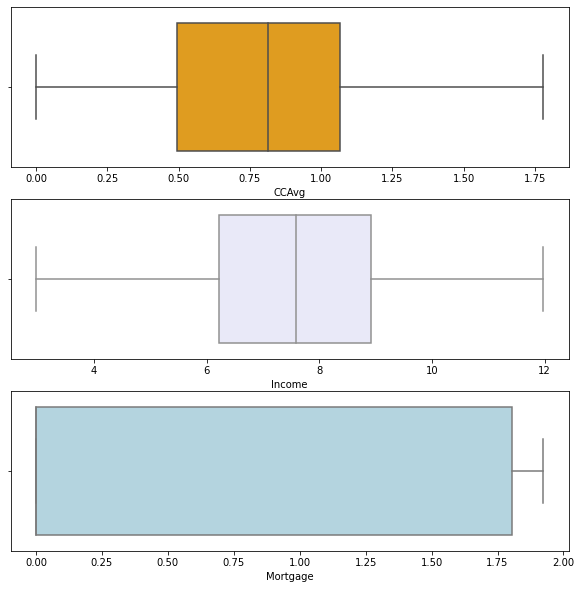

In [ ]:
# After Transformatiom
plt.figure(figsize= (10,10))

#CC Average
plt.subplot(3,1,1)
sns.boxplot(df.CCAvg, color='orange')

#Income
plt.subplot(3,1,2)
sns.boxplot(df.Income, color='lavender')

#Mortgage
plt.subplot(3,1,3)
sns.boxplot(df.Mortgage, color='lightblue')

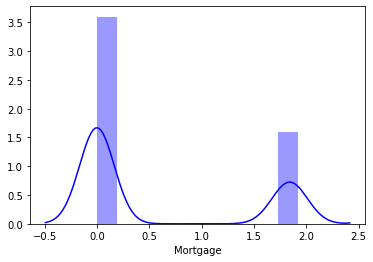

In [ ]:
#Mortgage 
sns.distplot(df.Mortgage, color='blue')

In [ ]:
#checking skewness after transformation

Skewness = pd.DataFrame({'Skewness' : [stats.skew(df.Income),stats.skew(df.CCAvg)
                                      ,stats.skew(df.Mortgage)]},index=['Income','CCAvg','Mortgage'])
Skewness

Kurtosis = pd.DataFrame({'Kurtosis' : [stats.kurtosis(df.Income),stats.kurtosis(df.CCAvg)
                                      ,stats.kurtosis(df.Mortgage)]},index=['Income','CCAvg','Mortgage'])

ND_check_new=pd.concat([Skewness,Kurtosis],axis=1)
ND_check_new


,Skewness,Kurtosis
Income,-0.038355,-0.648270
CCAvg,0.031999,-0.699294
Mortgage,0.835687,-1.298902


**5) Data splitting and data normalization** 

Before splitting the data, variables like 'ID','Experience' and 'ZIP Code' are dopped off.

ID and ZIP Code are unique numbers and they are not at all correlated to the target 'Personal Loan'.

Incase of Experience, Age and Experience are highly correlated with a score of 0.99. Hence, dropping of Experience doesn't impact the model.





In [ ]:
#Dropping off certain variables
df.drop('ID', axis=1, inplace = True)
df.drop('Experience', axis=1, inplace = True)
df.drop('ZIP Code', axis=1, inplace = True)

In [ ]:
df.shape

(5000, 11)

In [ ]:
#Total no. of negative values
sum(n < 0 for n in df.values.flatten())

0

Since 'Experience' is dropped, the no. of negative values turn to zero.

In [ ]:
#Assigning x (Feature) and y (Target) variables
x = df[['Age', 'Income', 'Family', 'CCAvg',
       'Education', 'Mortgage','SecuritiesAccount',
       'CDAccount', 'Online', 'CreditCard']].values
y = df['PersonalLoan'].values
x,y

(array([[25.        ,  6.82758253,  4.        , ...,  0.        ,
          0.        ,  0.        ],
        [45.        ,  5.87695225,  3.        , ...,  0.        ,
          0.        ,  0.        ],
        [39.        ,  3.50428679,  1.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [63.        ,  5.05817273,  2.        , ...,  0.        ,
          0.        ,  0.        ],
        [65.        ,  6.82758253,  3.        , ...,  0.        ,
          1.        ,  0.        ],
        [28.        ,  8.37927414,  3.        , ...,  0.        ,
          1.        ,  1.        ]]), array([0, 0, 0, ..., 0, 0, 0]))

In [ ]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, stratify=y, random_state=0)

In [ ]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
X_train = sc_x.fit_transform(x_train)
X_test = sc_x.transform(x_test)
X_train, X_test

(array([[ 0.50989681, -1.2640187 ,  0.52957214, ..., -0.24878345,
          0.83854816,  1.52960605],
        [ 1.64360991, -0.81169472, -1.21736706, ..., -0.24878345,
         -1.19253735, -0.65376311],
        [ 0.59710551, -0.96255849,  1.40304174, ..., -0.24878345,
          0.83854816,  1.52960605],
        ...,
        [ 1.55640121, -0.92359319, -1.21736706, ..., -0.24878345,
         -1.19253735, -0.65376311],
        [-0.88544239, -0.28217376, -0.34389746, ..., -0.24878345,
         -1.19253735,  1.52960605],
        [-1.32148589,  1.0888343 , -0.34389746, ..., -0.24878345,
          0.83854816, -0.65376311]]),
 array([[-0.97265109,  1.804387  , -1.21736706, ..., -0.24878345,
         -1.19253735, -0.65376311],
        [ 0.85873161,  0.38356794, -0.34389746, ..., -0.24878345,
         -1.19253735, -0.65376311],
        [ 0.24827071,  1.16034314, -1.21736706, ..., -0.24878345,
         -1.19253735, -0.65376311],
        ...,
        [ 0.68431421, -0.96255849, -0.34389746, ..., -

**6) Building Logistic Regression Model**

In [ ]:
#Implementing GridCVSearch for better hypertuning of the model
from sklearn.model_selection import GridSearchCV 
lg_grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
lg=LogisticRegression()
lg_cv=GridSearchCV(lg,lg_grid,cv=10)
lg_cv.fit(X_train,y_train)

In [ ]:
#Estimation of best parameters
lg_cv.best_params_

{'C': 1.0, 'penalty': 'l2'}

In [ ]:
#Fitting Logistic Regresssion to Training Set
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(C=1.0, penalty='l2',random_state =0)
classifier.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
#Predicting the Test Set Results
y_pred = classifier.predict(X_test)
y_prob = classifier.predict_proba(X_test)
y_pred, y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[4.10624274e-02, 9.58937573e-01],
        [9.97605626e-01, 2.39437385e-03],
        [9.76685822e-01, 2.33141778e-02],
        ...,
        [9.99812572e-01, 1.87428049e-04],
        [9.95520406e-01, 4.47959425e-03],
        [9.95935969e-01, 4.06403094e-03]]))

**7) Evaluation of Logistic Regression Model**


In [ ]:
sstr = "Evaluation of Logistic Regression Model"
print(sstr.center(120, '-'))

#Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

print('-'*120)

#Cross Validation
from sklearn.model_selection import cross_val_score
scores_lg = cross_val_score(classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_lg)

print('-'*120)

#Mean of each fold 
cross_lg= scores_lg.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_lg)

print('-'*120)

#Confusion Matrix
from sklearn.metrics import confusion_matrix
cm_lg = confusion_matrix(y_test, y_pred)
print ('CM=',cm_lg)

print('-'*120)

#Roc curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

rprob=classifier.predict_proba(X_test)
fpr1,tpr1,threshold1=roc_curve(y_test,rprob[:,1])
roc_auc1= metrics.auc(fpr1,tpr1)
print('ROC value =',roc_auc1)

print('_'*120)

----------------------------------------Evaluation of Logistic Regression Model-----------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      1356
           1       0.84      0.65      0.73       144

    accuracy                           0.95      1500
   macro avg       0.90      0.82      0.85      1500
weighted avg       0.95      0.95      0.95      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.95714286 0.96       0.93142857 0.95714286 0.95428571 0.95714286
 0.95428571 0.95428571 0.97142857 0.96285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 95.60000000000001
------------------------------------------------------------------------------------------------------

-----------------------------------------------Logistic Regression Model------------------------------------------------


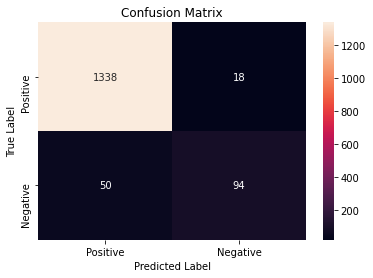

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Logistic Regression Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_lg, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import cohen_kappa_score 
from sklearn.metrics import matthews_corrcoef
sstr = "Evaluation of Logistic Regression Model"
print(sstr.center(120, '-'))

#Metrics
#Recall
rc_lg=recall_score(y_test,y_pred)
print ('Recall:', rc_lg)

print('-'*120)

#Precision
pr_lg=precision_score(y_test,y_pred)
print ('Precision:', pr_lg)

print('-'*120)

#F1 Score
f1_lg=f1_score(y_test,y_pred)
print ('F1 score:', f1_lg)

print('-'*120)

#ROC AUC Score
roc_lg=roc_auc_score(y_test,y_pred)
print ('Roc Auc Score:', roc_lg)

print('-'*120)

#Test Accuracy
test_lg= metrics.accuracy_score(y_test, y_pred)
print ('Test Accuracy:', test_lg)

print('-'*120)

#Train Accuracy
train_lg= classifier.score(X_train,y_train)
print ('Train Accuracy:', train_lg)

print('-'*120)

#Kappa Score
kappa_lg= metrics.cohen_kappa_score(y_test, y_pred)
print ('Kappa Score:', kappa_lg)

print('-'*120)

#Matthews Correlation Coefficient 
mcc_lg= metrics.matthews_corrcoef(y_test, y_pred)
print ('Matthews correlation coefficient :', mcc_lg)

print('_'*120)

----------------------------------------Evaluation of Logistic Regression Model-----------------------------------------
Recall: 0.6527777777777778
------------------------------------------------------------------------------------------------------------------------
Precision: 0.8392857142857143
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.734375
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.819751720747296
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9546666666666667
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9568571428571429
------------------------------------------------------------------------------------------------

In [ ]:
#Tabular column
a=pd.DataFrame({'Model':['Logistic Regression'],'Recall':rc_lg,'Precision':pr_lg,'F1 score':f1_lg, 'AUC':roc_lg,'Test Accuracy':test_lg,'Train Accuracy': train_lg,'Matthews Correlation Coefficient': mcc_lg,'Kappa Score': kappa_lg})
a

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Logistic Regression,0.652778,0.839286,0.734375,0.819752,0.954667,0.956857,0.716721,0.710016


**8) Building other classification algorithms**

Naive Bayes

In [ ]:
#GridSearchCV
from sklearn.naive_bayes import GaussianNB
nb_grid = {'var_smoothing': np.logspace(0,-9, num=100)}
nb= GaussianNB()
nb_cv=GridSearchCV(nb,nb_grid,cv=10)
nb_cv.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=GaussianNB(priors=None, var_smoothing=1e-09),
             iid='deprecated', n_jobs=None,
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6....
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
nb_cv.best_params_

{'var_smoothing': 0.002848035868435802}

In [ ]:
#Fitting the model
nb_classifier = GaussianNB(var_smoothing=0.002848035868435802)  
nb_classifier.fit(X_train, y_train)  
nb_y_pred = nb_classifier.predict(X_test)  
nb_y_prob = nb_classifier.predict_proba(X_test)
nb_y_pred, nb_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[2.58707635e-01, 7.41292365e-01],
        [9.79019621e-01, 2.09803794e-02],
        [5.95354009e-01, 4.04645991e-01],
        ...,
        [9.99999985e-01, 1.54816683e-08],
        [9.99954360e-01, 4.56400106e-05],
        [9.99872850e-01, 1.27149644e-04]]))

In [ ]:
sstr = "Evaluation of Naive Bayes Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, nb_y_pred))

print('-'*120)

#Cross Validation
scores_nb = cross_val_score(nb_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_nb)

print('-'*120)

#Mean of each fold 
cross_nb= scores_nb.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_nb)

print('-'*120)

#Confusion Matrix
cm_nb = confusion_matrix(y_test, nb_y_pred)
print ('CM=',cm_nb)

print('-'*120)

#Roc curve
nbprob=nb_classifier.predict_proba(X_test)
fpr2,tpr2,threshold2=roc_curve(y_test,nbprob[:,1])
roc_auc2= metrics.auc(fpr2,tpr2)
print('ROC value=',roc_auc2)

print('_'*120)


--------------------------------------------Evaluation of Naive Bayes Model---------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1356
           1       0.66      0.53      0.59       144

    accuracy                           0.93      1500
   macro avg       0.80      0.75      0.78      1500
weighted avg       0.92      0.93      0.93      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.94       0.93428571 0.94       0.91714286 0.94285714 0.91714286
 0.92571429 0.92       0.91142857 0.92285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 92.71428571428572
------------------------------------------------------------------------------------------------------

---------------------------------------------------Naive Bayes Model----------------------------------------------------


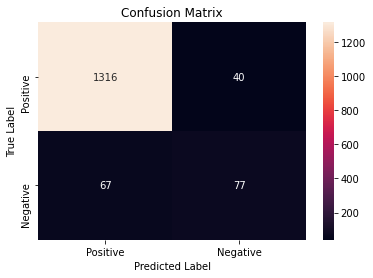

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Naive Bayes Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_nb, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Naive Bayes Model"
print(sstr.center(120, '-'))

#Metrics

rc_nb=recall_score(y_test,nb_y_pred)
print ('Recall:', rc_nb)

print('-'*120)

pr_nb=precision_score(y_test,nb_y_pred)
print ('Precision:', pr_nb)

print('-'*120)

f1_nb=f1_score(y_test,nb_y_pred)
print ('F1 score:', f1_nb)

print('-'*120)

roc_nb=roc_auc_score(y_test,nb_y_pred)
print ('Roc Auc Score:', roc_nb)

print('-'*120)

test_nb= metrics.accuracy_score(y_test, nb_y_pred)
print ('Test Accuracy:', test_nb)

print('-'*120)

train_nb= nb_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_nb)

print('-'*120)

kappa_nb= metrics.cohen_kappa_score(y_test, nb_y_pred)
print ('Kappa Score:', kappa_nb)

print('-'*120)

mcc_nb= metrics.matthews_corrcoef(y_test, nb_y_pred)
print ('Matthews correlation coefficient :', mcc_nb)

print('_'*120)

--------------------------------------------Evaluation of Naive Bayes Model---------------------------------------------
Recall: 0.5347222222222222
------------------------------------------------------------------------------------------------------------------------
Precision: 0.6581196581196581
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.5900383141762452
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.752611848574238
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9286666666666666
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9277142857142857
--------------------------------------------------------------------------------------

In [ ]:
b=pd.DataFrame({'Model':['Naive Bayes'],'Recall':rc_nb,'Precision':pr_nb,'F1 score':f1_nb, 'AUC':roc_nb,'Test Accuracy':test_nb,'Train Accuracy': train_nb,'Matthews Correlation Coefficient': mcc_nb,'Kappa Score': kappa_nb})
b

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Naive Bayes,0.534722,0.65812,0.590038,0.752612,0.928667,0.927714,0.554997,0.55143


K Nearest Neighbor Classifier 

In [ ]:
#GridSearchCv
from sklearn.neighbors import KNeighborsClassifier
grid={"p":np.arange(1,11), "n_neighbors":np.arange(1,20)}# l1 lasso l2 ridge
knn=KNeighborsClassifier()
grid_kn=GridSearchCV(knn,grid,cv=10, n_jobs=-1)
grid_kn.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                         'p': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
grid_kn.best_params_

{'n_neighbors': 3, 'p': 4}

In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors=3, p=4)  
knn_classifier.fit(X_train, y_train)  
knn_y_pred = knn_classifier.predict(X_test)  
knn_y_prob = knn_classifier.predict_proba(X_test)
knn_y_pred, knn_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0., 1.],
        [1., 0.],
        [1., 0.],
        ...,
        [1., 0.],
        [1., 0.],
        [1., 0.]]))

In [ ]:
sstr = "Evaluation of K Nearest Neighbor Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, knn_y_pred))

print('-'*120)

#Cross Validation
scores_knn = cross_val_score(knn_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_knn)

print('-'*120)

#Mean of each fold 
cross_knn= scores_knn.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_knn)

print('-'*120)

#Confusion Matrix
cm_knn = confusion_matrix(y_test, knn_y_pred)
print ('CM=',cm_knn)

print('-'*120)

#Roc curve
knnprob=knn_classifier.predict_proba(X_test)
fpr3,tpr3,threshold3=roc_curve(y_test,knnprob[:,1])
roc_auc3= metrics.auc(fpr3,tpr3)
print('ROC value=',roc_auc3)

print('_'*120)



-----------------------------------------Evaluation of K Nearest Neighbor Model-----------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1356
           1       0.92      0.68      0.78       144

    accuracy                           0.96      1500
   macro avg       0.95      0.84      0.88      1500
weighted avg       0.96      0.96      0.96      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.95714286 0.97142857 0.95428571 0.96857143 0.96       0.94857143
 0.95142857 0.95714286 0.96571429 0.96857143]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 96.02857142857142
------------------------------------------------------------------------------------------------------

------------------------------------------------K Nearest Neighbor Model------------------------------------------------


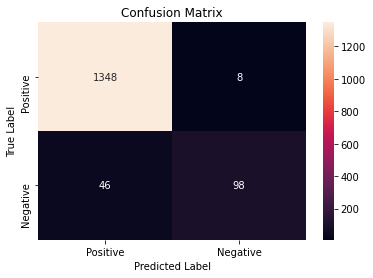

________________________________________________________________________________________________________________________


In [ ]:
sstr = "K Nearest Neighbor Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_knn, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of K Nearest Neighbor Model"
print(sstr.center(120, '-'))

#Metrics

rc_knn=recall_score(y_test,knn_y_pred)
print ('Recall:', rc_knn)

print('-'*120)

pr_knn=precision_score(y_test,knn_y_pred)
print ('Precision:', pr_knn)

print('-'*120)

f1_knn=f1_score(y_test,knn_y_pred)
print ('F1 score:', f1_knn)

print('-'*120)

roc_knn=roc_auc_score(y_test,knn_y_pred)
print ('Roc Auc Score:', roc_knn)

print('-'*120)

test_knn= metrics.accuracy_score(y_test, knn_y_pred)
print ('Test Accuracy:', test_knn)

print('-'*120)

train_knn= knn_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_knn)

print('-'*120)

kappa_knn= metrics.cohen_kappa_score(y_test, knn_y_pred)
print ('Kappa Score:', kappa_knn)

print('-'*120)

mcc_knn= metrics.matthews_corrcoef(y_test, knn_y_pred)
print ('Matthews correlation coefficient :', mcc_knn)

print('_'*120)

-----------------------------------------Evaluation of K Nearest Neighbor Model-----------------------------------------
Recall: 0.6805555555555556
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9245283018867925
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.784
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.8373279252704032
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.964
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9748571428571429
---------------------------------------------------------------------------------------------------------------

In [ ]:
c=pd.DataFrame({'Model':['KNN Classifier'],'Recall':rc_knn,'Precision':pr_knn,'F1 score':f1_knn, 'AUC':roc_knn,'Test Accuracy':test_knn,'Train Accuracy': train_knn,'Matthews Correlation Coefficient': mcc_knn,'Kappa Score': kappa_knn})
c

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,KNN Classifier,0.680556,0.924528,0.784,0.837328,0.964,0.974857,0.775549,0.764858


Support Vector Machine

In [ ]:
from sklearn.svm import SVC 
# defining parameter range 
svm_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['rbf']}
svm=SVC()
grid_svc=GridSearchCV(svm,svm_grid,cv=10,n_jobs=-1)
grid_svc.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
grid_svc.best_params_

{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}

In [ ]:
svm_classifier = SVC(kernel='rbf', C = 1000, gamma= 0.01, random_state=0, probability= True)  
svm_classifier.fit(X_train, y_train) 
svm_y_pred = svm_classifier.predict(X_test)  
svm_y_prob = svm_classifier.predict_proba(X_test)
svm_y_pred, svm_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[1.28607401e-07, 9.99999871e-01],
        [9.85343657e-01, 1.46563433e-02],
        [9.76074946e-01, 2.39250540e-02],
        ...,
        [9.99999900e-01, 1.00000010e-07],
        [9.99879935e-01, 1.20064878e-04],
        [9.99999900e-01, 1.00000010e-07]]))

In [ ]:
sstr = "Evaluation of Support Vector Machine Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, svm_y_pred))

print('-'*120)

#Cross Validation
scores_svm = cross_val_score(svm_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_svm)

print('-'*120)

#Mean of each fold 
cross_svm= scores_svm.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_svm)

print('-'*120)

#Confusion Matrix
cm_svm = confusion_matrix(y_test, svm_y_pred)
print ('CM=',cm_svm)

print('-'*120)

#Roc curve
svmprob=svm_classifier.predict_proba(X_test)
fpr4,tpr4,threshold4=roc_curve(y_test,svmprob[:,1])
roc_auc4= metrics.auc(fpr4,tpr4)
print('ROC=',roc_auc4)

print('_'*120)

---------------------------------------Evaluation of Support Vector Machine Model---------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.94      0.91      0.92       144

    accuracy                           0.99      1500
   macro avg       0.96      0.95      0.96      1500
weighted avg       0.99      0.99      0.99      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98285714 0.99142857 0.98       0.98285714 0.98285714 0.96857143
 0.97428571 0.97714286 0.98571429 0.97714286]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.02857142857142
------------------------------------------------------------------------------------------------------

----------------------------------------------Support Vector Machine Model----------------------------------------------


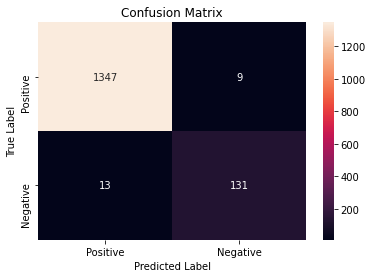

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Support Vector Machine Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_svm, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Support Vector Machine Model"
print(sstr.center(120, '-'))

rc_svm=recall_score(y_test,svm_y_pred)
print ('Recall:', rc_svm)

print('-'*120)

pr_svm=precision_score(y_test,svm_y_pred)
print ('Precision:', pr_svm)

print('-'*120)

f1_svm=f1_score(y_test,svm_y_pred)
print ('F1 score:', f1_svm)

print('-'*120)

roc_svm=roc_auc_score(y_test,svm_y_pred)
print ('Roc Auc Score:', roc_svm)

print('-'*120)

test_svm= metrics.accuracy_score(y_test, svm_y_pred)
print ('Test Accuracy:', test_svm)

print('-'*120)

train_svm= svm_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_svm)

print('-'*120)

kappa_svm= metrics.cohen_kappa_score(y_test, svm_y_pred)
print ('Kappa Score:', kappa_svm)

print('-'*120)

mcc_svm= metrics.matthews_corrcoef(y_test, svm_y_pred)
print ('Matthews correlation coefficient :', mcc_svm)

print('_'*120)

---------------------------------------Evaluation of Support Vector Machine Model---------------------------------------
Recall: 0.9097222222222222
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9357142857142857
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9225352112676057
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9515425270403147
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9853333333333333
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9888571428571429
-------------------------------------------------------------------------------------

In [ ]:
d=pd.DataFrame({'Model':['Support Vector Machine'],'Recall':rc_svm,'Precision':pr_svm,'F1 score':f1_svm, 'AUC':roc_svm,'Test Accuracy':test_svm,'Train Accuracy': train_svm, 'Matthews Correlation Coefficient': mcc_svm,'Kappa Score': kappa_svm})
d

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Support Vector Machine,0.909722,0.935714,0.922535,0.951543,0.985333,0.988857,0.914548,0.914437


Decision Tree Classifier (Entropy)

In [ ]:
#Implementing GridSearchCv
from sklearn.tree import DecisionTreeClassifier
DT_grid = {'criterion':['entropy'],'max_depth': np.arange(1, 20)}
DT=DecisionTreeClassifier()
grid_DT = GridSearchCV(DT,DT_grid,cv=10,n_jobs=-1)
grid_DT.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['entropy'],
                         'ma

In [ ]:
grid_DT.best_params_

{'criterion': 'entropy', 'max_depth': 4}

In [ ]:
DT_classifier= DecisionTreeClassifier(criterion= 'entropy',max_depth=4,random_state= 0)
DT_classifier.fit(X_train,y_train)
DT_y_pred = DT_classifier.predict(X_test)
DT_y_prob = DT_classifier.predict_proba(X_test)
DT_y_pred, DT_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.        , 1.        ],
        [0.97590361, 0.02409639],
        [1.        , 0.        ],
        ...,
        [1.        , 0.        ],
        [1.        , 0.        ],
        [1.        , 0.        ]]))

In [ ]:
sstr = "Evaluation of Decision Tree (Entropy) Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, DT_y_pred))

print('-'*120)

#Cross Validation
scores_DT = cross_val_score(DT_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_DT)

print('-'*120)

#Mean of each fold 
cross_DT= scores_DT.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_DT)

print('-'*120)

#Confusion Matrix
cm_DT = confusion_matrix(y_test, DT_y_pred)
print ('CM=',cm_DT)

print('-'*120)

#Roc curve
DTprob=DT_classifier.predict_proba(X_test)
fpr5,tpr5,threshold5=roc_curve(y_test,DTprob[:,1])
roc_auc5= metrics.auc(fpr5,tpr5)
print('ROC=',roc_auc5)

print('_'*120)

--------------------------------------Evaluation of Decision Tree (Entropy) Model---------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.93      0.88      0.90       144

    accuracy                           0.98      1500
   macro avg       0.96      0.94      0.95      1500
weighted avg       0.98      0.98      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98285714 0.99714286 0.98       0.97428571 0.98285714 0.98
 0.98285714 0.98571429 0.98857143 0.98      ]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.34285714285714
------------------------------------------------------------------------------------------------------------

---------------------------------------------Decision Tree (Entropy) Model----------------------------------------------


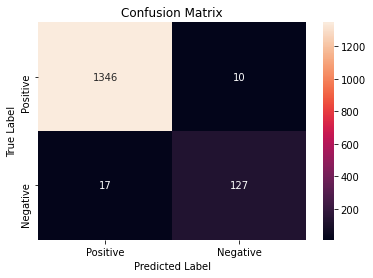

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Decision Tree (Entropy) Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_DT, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Decision Tree (Entropy) Model"
print(sstr.center(120, '-'))

rc_DT=recall_score(y_test,DT_y_pred)
print ('Recall:', rc_DT)

print('-'*120)

pr_DT=precision_score(y_test,DT_y_pred)
print ('Precision:', pr_DT)

print('-'*120)

f1_DT=f1_score(y_test,DT_y_pred)
print ('F1 score:', f1_DT)

print('-'*120)

roc_DT=roc_auc_score(y_test,DT_y_pred)
print ('Roc Auc Score:', roc_DT)

print('-'*120)

test_DT= metrics.accuracy_score(y_test, DT_y_pred)
print ('Test Accuracy:', test_DT)

print('-'*120)

train_DT= DT_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_DT)

print('-'*120)

kappa_DT= metrics.cohen_kappa_score(y_test, DT_y_pred)
print ('Kappa Score:', kappa_DT)

print('-'*120)

mcc_DT= metrics.matthews_corrcoef(y_test, DT_y_pred)
print ('Matthews correlation coefficient :', mcc_DT)

print('_'*120)

--------------------------------------Evaluation of Decision Tree (Entropy) Model---------------------------------------
Recall: 0.8819444444444444
------------------------------------------------------------------------------------------------------------------------
Precision: 0.927007299270073
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9039145907473309
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9372849065880039
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.982
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9877142857142858
---------------------------------------------------------------------------------------------------

In [ ]:
e=pd.DataFrame({'Model':['Decision Tree (Entropy)'],'Recall':rc_DT,'Precision':pr_DT,'F1 score':f1_DT, 'AUC':roc_DT,'Test Accuracy':test_DT,'Train Accuracy': train_DT,'Matthews Correlation Coefficient': mcc_DT,'Kappa Score': kappa_DT})
e

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Decision Tree (Entropy),0.881944,0.927007,0.903915,0.937285,0.982,0.987714,0.894329,0.893991


Decision Tree Classifier (Gini)

In [ ]:
#GridSearchCV
from sklearn.tree import DecisionTreeClassifier
DTg_grid = {'criterion':['gini'],'max_depth': np.arange(1, 20)}
DTg=DecisionTreeClassifier()
grid_DTg = GridSearchCV(DTg,DTg_grid,cv=10)
grid_DTg.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini'],
                         'max

In [ ]:
grid_DTg.best_params_

{'criterion': 'gini', 'max_depth': 6}

In [ ]:
#Fitting the model
DTg_classifier= DecisionTreeClassifier(criterion= 'gini',max_depth=6,random_state= 0)
DTg_classifier.fit(X_train,y_train)
DTg_y_pred = DTg_classifier.predict(X_test)
DTg_y_prob = DTg_classifier.predict_proba(X_test)
DTg_y_pred, DTg_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.        , 1.        ],
        [0.97560976, 0.02439024],
        [1.        , 0.        ],
        ...,
        [1.        , 0.        ],
        [1.        , 0.        ],
        [1.        , 0.        ]]))

In [ ]:
sstr = "Evaluation of Decision Tree (Gini) Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, DTg_y_pred))

print('-'*120)

#Cross Validation
scores_DTg = cross_val_score(DTg_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_DTg)

print('-'*120)

#Mean of each fold 
cross_DTg= scores_DTg.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_DTg)

print('-'*120)

#Confusion Matrix
cm_DTg = confusion_matrix(y_test, DTg_y_pred)
print ('CM=',cm_DTg)

print('-'*120)

#Roc curve
DTgprob=DTg_classifier.predict_proba(X_test)
fpr6,tpr6,threshold6=roc_curve(y_test,DTgprob[:,1])
roc_auc6= metrics.auc(fpr6,tpr6)
print('ROC=',roc_auc6)

print('_'*120)

----------------------------------------Evaluation of Decision Tree (Gini) Model----------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.92      0.88      0.90       144

    accuracy                           0.98      1500
   macro avg       0.95      0.94      0.95      1500
weighted avg       0.98      0.98      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98       0.99428571 0.98571429 0.97428571 0.98285714 0.97714286
 0.98285714 0.99142857 0.99142857 0.98      ]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.4
-------------------------------------------------------------------------------------------------------------------

-----------------------------------------------Decision Tree (Gini) Model-----------------------------------------------


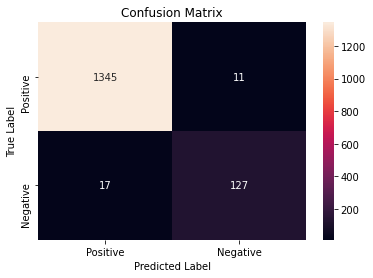

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Decision Tree (Gini) Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_DTg, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Decision Tree (Gini) Model"
print(sstr.center(120, '-'))

rc_DTg=recall_score(y_test,DTg_y_pred)
print ('Recall:', rc_DTg)

print('-'*120)

pr_DTg=precision_score(y_test,DTg_y_pred)
print ('Precision:', pr_DTg)

print('-'*120)

f1_DTg=f1_score(y_test,DTg_y_pred)
print ('F1 score:', f1_DTg)

print('-'*120)

roc_DTg=roc_auc_score(y_test,DTg_y_pred)
print ('Roc Auc Score:', roc_DTg)

print('-'*120)

test_DTg= metrics.accuracy_score(y_test, DTg_y_pred)
print ('Test Accuracy:', test_DTg)

print('-'*120)

train_DTg= DTg_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_DTg)

print('-'*120)

kappa_DTg= metrics.cohen_kappa_score(y_test,DTg_y_pred)
print ('Kappa Score:', kappa_DTg)

print('-'*120)

mcc_DTg= metrics.matthews_corrcoef(y_test, DTg_y_pred)
print ('Matthews correlation coefficient :', mcc_DTg)

print('_'*120)

----------------------------------------Evaluation of Decision Tree (Gini) Model----------------------------------------
Recall: 0.8819444444444444
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9202898550724637
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.900709219858156
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9369161750245821
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9813333333333333
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9917142857142857
--------------------------------------------------------------------------------------

In [ ]:
f=pd.DataFrame({'Model':['Decision Tree (Gini)'],'Recall':rc_DTg,'Precision':pr_DTg,'F1 score':f1_DTg, 'AUC':roc_DTg,'Test Accuracy':test_DTg,'Train Accuracy': train_DTg,'Matthews Correlation Coefficient': mcc_DTg,'Kappa Score':kappa_DTg})
f

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Decision Tree (Gini),0.881944,0.92029,0.900709,0.936916,0.981333,0.991714,0.890658,0.890413


Random Forest Classifier (Entropy)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RFe_grid= {'criterion': ['entropy'],'max_depth': [19], 'min_samples_split': np.arange (1,6), 'n_estimators':[100]}
RFe=RandomForestClassifier()
grid_RFe = GridSearchCV(RFe,RFe_grid,cv=10, n_jobs=-1)
grid_RFe.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rand

In [ ]:
grid_RFe.best_params_

{'criterion': 'entropy',
 'max_depth': 19,
 'min_samples_split': 3,
 'n_estimators': 100}

In [ ]:
#Fitting the model
rf_classifier = RandomForestClassifier(n_estimators=100,criterion= 'entropy',max_depth=19,min_samples_split=3,random_state=0)
rf_classifier.fit(X_train, y_train)
rf_y_pred = rf_classifier.predict(X_test)
rf_y_prob = rf_classifier.predict_proba(X_test)
rf_y_pred, rf_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.05      , 0.95      ],
        [0.89666667, 0.10333333],
        [0.99      , 0.01      ],
        ...,
        [1.        , 0.        ],
        [0.99      , 0.01      ],
        [1.        , 0.        ]]))

In [ ]:
sstr = "Evaluation of Random Forest (Entropy) Model"
print(sstr.center(120, '-'))

#Classification Report
print(classification_report(y_test, rf_y_pred))

print('-'*120)

#Cross Validation
scores_rf = cross_val_score(rf_classifier, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_rf)

print('-'*120)

#Mean of each fold 
cross_rf= scores_rf.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_rf)

print('-'*120)

#Confusion Matrix
cm_rf = confusion_matrix(y_test, rf_y_pred)
print ('CM=',cm_rf)

print('-'*120)

#Roc curve
rfprob=rf_classifier.predict_proba(X_test)
fpr7,tpr7,threshold7=roc_curve(y_test,rfprob[:,1])
roc_auc7= metrics.auc(fpr7,tpr7)
print('ROC=',roc_auc7)

print('_'*120)

--------------------------------------Evaluation of Random Forest (Entropy) Model---------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1356
           1       0.96      0.91      0.93       144

    accuracy                           0.99      1500
   macro avg       0.97      0.95      0.96      1500
weighted avg       0.99      0.99      0.99      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98285714 1.         0.98285714 0.98571429 0.98285714 0.97428571
 0.98285714 0.98571429 0.98857143 0.98571429]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.51428571428572
------------------------------------------------------------------------------------------------------

---------------------------------------------Random Forest (Entropy) Model----------------------------------------------


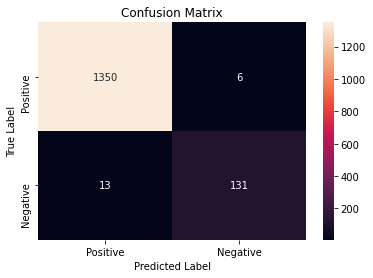

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Random Forest (Entropy) Model"
print(sstr.center(120, '-'))

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_rf, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Random Forest (Entropy) Model"
print(sstr.center(120, '-'))

rc_rf=recall_score(y_test,rf_y_pred)
print ('Recall:', rc_rf)

print('-'*120)

pr_rf=precision_score(y_test,rf_y_pred)
print ('Precision:', pr_rf)

print('-'*120)

f1_rf=f1_score(y_test,rf_y_pred)
print ('F1 score:', f1_rf)

print('-'*120)

roc_rf=roc_auc_score(y_test,rf_y_pred)
print ('Roc Auc Score:', roc_rf)

print('-'*120)

test_rf= metrics.accuracy_score(y_test, rf_y_pred)
print ('Test Accuracy:', test_rf)

print('-'*120)

train_rf= rf_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_rf)

print('-'*120)

kappa_rf= metrics.cohen_kappa_score(y_test,rf_y_pred)
print ('Kappa Score:', kappa_rf)

print('-'*120)

mcc_rf= metrics.matthews_corrcoef(y_test, rf_y_pred)
print ('Matthews correlation coefficient :', mcc_rf)

print('_'*120)

--------------------------------------Evaluation of Random Forest (Entropy) Model---------------------------------------
Recall: 0.9097222222222222
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9562043795620438
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9323843416370107
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9526487217305801
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9873333333333333
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9997142857142857
-------------------------------------------------------------------------------------

In [ ]:
g=pd.DataFrame({'Model':['Random Forest (Entropy)'],'Recall':rc_rf,'Precision':pr_rf,'F1 score':f1_rf, 'AUC':roc_rf,'Test Accuracy':test_rf,'Train Accuracy': train_rf,'Matthews Correlation Coefficient':mcc_rf,'Kappa Score': kappa_rf})
g

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Random Forest (Entropy),0.909722,0.956204,0.932384,0.952649,0.987333,0.999714,0.925751,0.925401


Random Forest (Gini)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RFg_grid= {'criterion': ['gini'],'max_depth': [14], 'min_samples_split': np.arange (1,6), 'n_estimators':[100]}
RFg=RandomForestClassifier()
grid_RFg = GridSearchCV(RFg,RFg_grid,cv=10, n_jobs=-1)
grid_RFg.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rand

In [ ]:
grid_RFg.best_params_

{'criterion': 'gini',
 'max_depth': 14,
 'min_samples_split': 3,
 'n_estimators': 100}

In [ ]:
#Fitting the model
rfg_classifier = RandomForestClassifier(n_estimators= 100,criterion= 'gini',max_depth=14,min_samples_split=3,random_state=0)
rfg_classifier.fit(X_train, y_train)
rfg_y_pred = rfg_classifier.predict(X_test)
rfg_y_prob = rfg_classifier.predict_proba(X_test)
rfg_y_pred, rfg_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.02      , 0.98      ],
        [0.97166667, 0.02833333],
        [1.        , 0.        ],
        ...,
        [1.        , 0.        ],
        [0.995     , 0.005     ],
        [1.        , 0.        ]]))

In [ ]:
sstr = "Evaluation of Random Forest (Gini) Model"
print(sstr.center(120, '-')) 

#Classification Report
print(classification_report(y_test, rfg_y_pred))

print('-'*120)

#Cross Validation
scores_rfg = cross_val_score(rfg_classifier, X_train, y_train,scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_rfg)

print('-'*120)

#Mean of each fold 
cross_rfg= scores_rfg.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_rfg)

print('-'*120)

#Confusion Matrix
cm_rfg = confusion_matrix(y_test, rfg_y_pred)
print ('CM=',cm_rfg)

print('-'*120)

#Roc curve
rfgprob=rfg_classifier.predict_proba(X_test)
fpr8,tpr8,threshold8=roc_curve(y_test,rfgprob[:,1])
roc_auc8= metrics.auc(fpr8,tpr8)
print('ROC=',roc_auc8)

print('_'*120)

----------------------------------------Evaluation of Random Forest (Gini) Model----------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1356
           1       0.98      0.91      0.95       144

    accuracy                           0.99      1500
   macro avg       0.99      0.95      0.97      1500
weighted avg       0.99      0.99      0.99      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98571429 1.         0.98571429 0.98571429 0.98       0.97142857
 0.98571429 0.98571429 0.99142857 0.98571429]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.57142857142858
------------------------------------------------------------------------------------------------------

-----------------------------------------------Random Forest (Gini) Model-----------------------------------------------


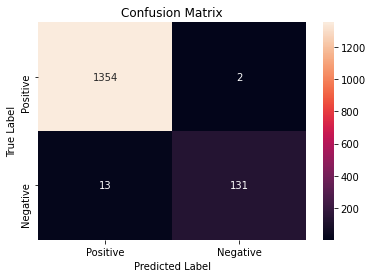

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Random Forest (Gini) Model"
print(sstr.center(120, '-')) 

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_rfg, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Random Forest (Gini) Model"
print(sstr.center(120, '-')) 

#Metrics

rc_rfg=recall_score(y_test,rfg_y_pred)
print ('Recall:', rc_rfg)

print('-'*120)

pr_rfg=precision_score(y_test,rfg_y_pred)
print ('Precision:', pr_rfg)

print('-'*120)

f1_rfg=f1_score(y_test,rfg_y_pred)
print ('F1 score:', f1_rfg)

print('-'*120)

roc_rfg=roc_auc_score(y_test,rfg_y_pred)
print ('Roc Auc Score:', roc_rfg)

print('-'*120)

test_rfg= metrics.accuracy_score(y_test, rfg_y_pred)
print ('Test Accuracy:', test_rfg)

print('-'*120)

train_rfg= rfg_classifier.score(X_train,y_train)
print ('Train Accuracy:', train_rfg)

print('-'*120)

kappa_rfg= metrics.cohen_kappa_score(y_test,rfg_y_pred)
print ('Kappa Score:', kappa_rfg)

print('-'*120)

mcc_rfg= metrics.matthews_corrcoef(y_test, rfg_y_pred)
print ('Matthews correlation coefficient :', mcc_rfg)

print('_'*120)

----------------------------------------Evaluation of Random Forest (Gini) Model----------------------------------------
Recall: 0.9097222222222222
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9849624060150376
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9458483754512635
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9541236479842675
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.99
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9997142857142857
---------------------------------------------------------------------------------------------------

In [ ]:
h=pd.DataFrame({'Model':['Random Forest (Gini)'],'Recall':rc_rfg,'Precision':pr_rfg,'F1 score':f1_rfg, 'AUC':roc_rfg,'Test Accuracy':test_rfg,'Train Accuracy': train_rfg,'Matthews Correlation Coefficient': mcc_rfg,'Kappa Score': kappa_rfg})
h

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Random Forest (Gini),0.909722,0.984962,0.945848,0.954124,0.99,0.999714,0.94125,0.940349


Bagging Trees Classifier (Decision Tree Classifier)

In [ ]:
from sklearn.ensemble import BaggingClassifier
grid_b = {'max_samples' : [0.05, 0.1, 0.2, 0.5], 'n_estimators':[100]}
bgc=BaggingClassifier(DecisionTreeClassifier('entropy'))
grid_bge=GridSearchCV(bgc,grid_b,cv=10, n_jobs=-1 )
grid_bge.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                                               class_weight=None,
                                                                               criterion='entropy',
                                                                               max_depth=None,
                                                                               max_features=None,
                                                                               max_leaf_nodes=None,
                                                                               min_impurity_decrease=0.0,
                                                                               min_impurity_split=None,
                                                                               min_samples_leaf=1,
                                                                     

In [ ]:
grid_bge.best_params_

{'max_samples': 0.5, 'n_estimators': 100}

In [ ]:
#Fitting the model
bge=BaggingClassifier(base_estimator= DecisionTreeClassifier(criterion='entropy'), n_estimators=100,max_samples=0.5,random_state=0)
bge.fit(X_train,y_train)
bge_y_pred = bge.predict(X_test)
bge_y_prob = bge.predict_proba(X_test)
bge_y_pred, bge_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.  , 1.  ],
        [0.91, 0.09],
        [1.  , 0.  ],
        ...,
        [1.  , 0.  ],
        [1.  , 0.  ],
        [1.  , 0.  ]]))

In [ ]:
sstr = "Evaluation of Bagging Tree (Decision Tree Classifier) Model"
print(sstr.center(120, '-')) 

#Classification Report
print(classification_report(y_test, bge_y_pred))

print('-'*120)

#Cross Validation
scores_bge = cross_val_score(bge, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_bge)

print('-'*120)

#Mean of each fold 
cross_bge= scores_bge.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_bge)

print('-'*120)

#Confusion Matrix
cm_bge = confusion_matrix(y_test, bge_y_pred)
print ('CM=',cm_bge)

print('-'*120)

#Roc curve
bgeprob=bge.predict_proba(X_test)
fpr9,tpr9,threshold9=roc_curve(y_test,bgeprob[:,1])
roc_auc9= metrics.auc(fpr9,tpr9)
print('ROC=',roc_auc9)

print('_'*120)

------------------------------Evaluation of Bagging Tree (Decision Tree Classifier) Model-------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.93      0.90      0.92       144

    accuracy                           0.98      1500
   macro avg       0.96      0.95      0.95      1500
weighted avg       0.98      0.98      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98285714 1.         0.97714286 0.97142857 0.98285714 0.97714286
 0.98285714 0.98571429 0.99142857 0.98285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.34285714285714
------------------------------------------------------------------------------------------------------

-------------------------------------Bagging Tree (Decision Tree Classifier) Model--------------------------------------


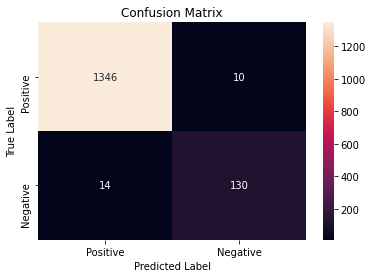

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Bagging Tree (Decision Tree Classifier) Model"
print(sstr.center(120, '-')) 

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_bge, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Bagging Tree (Decision Tree Classifier) Model"
print(sstr.center(120, '-')) 

#Metrics

rc_bge=recall_score(y_test,bge_y_pred)
print('Recall:', rc_bge)

print('-'*120)

pr_bge=precision_score(y_test,bge_y_pred)
print('Precision:', pr_bge)

print('-'*120)

f1_bge=f1_score(y_test,bge_y_pred)
print ('F1 score:', f1_bge)

print('-'*120)

roc_bge=roc_auc_score(y_test,bge_y_pred)
print ('Roc Auc Score:', roc_bge)

print('-'*120)

test_bge= metrics.accuracy_score(y_test, bge_y_pred)
print ('Test Accuracy:', test_bge)

print('-'*120)

train_bge= bge.score(X_train,y_train)
print ('Train Accuracy:', train_bge)

print('-'*120)

kappa_bge= metrics.cohen_kappa_score(y_test,bge_y_pred)
print ('Kappa Score:', kappa_bge)

print('-'*120)

mcc_bge= metrics.matthews_corrcoef(y_test, bge_y_pred)
print ('Matthews correlation coefficient :', mcc_bge)

print('_'*120)

------------------------------Evaluation of Bagging Tree (Decision Tree Classifier) Model-------------------------------
Recall: 0.9027777777777778
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9285714285714286
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9154929577464788
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9477015732546705
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.984
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.996
---------------------------------------------------------------------------------------------------------------

In [ ]:
i=pd.DataFrame({'Model':['Bagging Tree (DT=Entropy)'],'Recall':rc_bge,'Precision':pr_bge,'F1 score':f1_bge, 'AUC':roc_bge,'Test Accuracy':test_bge,'Train Accuracy': train_bge,'Matthews Correlation Coefficient':mcc_bge,'Kappa Score':kappa_bge})
i

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Bagging Tree (DT=Entropy),0.902778,0.928571,0.915493,0.947702,0.984,0.996,0.906768,0.906658


Bagging Tree Classifier (Random Forest Classifier)

In [ ]:
#Fitting the model
bgr=BaggingClassifier(base_estimator= RandomForestClassifier(criterion='gini'), n_estimators=100,max_samples=0.5,random_state=0)
bgr.fit(X_train,y_train)
bgr_y_pred = bgr.predict(X_test)
bgr_y_prob = bgr.predict_proba(X_test)
bgr_y_pred, bgr_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[8.880e-02, 9.112e-01],
        [9.448e-01, 5.520e-02],
        [9.757e-01, 2.430e-02],
        ...,
        [9.969e-01, 3.100e-03],
        [9.929e-01, 7.100e-03],
        [9.992e-01, 8.000e-04]]))

In [ ]:
sstr = "Evaluation of Bagging Tree (Random Forest Classifier) Model"
print(sstr.center(120, '-')) 

#Classification Report
print(classification_report(y_test, bgr_y_pred))

print('-'*120)

#Cross Validation
scores_bgr = cross_val_score(bgr, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_bgr)

print('-'*120)

#Mean of each fold 
cross_bgr= scores_bgr.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_bgr)

print('-'*120)

#Confusion Matrix
cm_bgr = confusion_matrix(y_test, bgr_y_pred)
print ('CM=',cm_bgr)

print('-'*120)

#Roc curve
bgrprob=bgr.predict_proba(X_test)
fpr10,tpr10,threshold10=roc_curve(y_test,bgrprob[:,1])
roc_auc10= metrics.auc(fpr10,tpr10)
print('ROC=',roc_auc10)

print('_'*120)

------------------------------Evaluation of Bagging Tree (Random Forest Classifier) Model-------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1356
           1       0.98      0.86      0.92       144

    accuracy                           0.99      1500
   macro avg       0.98      0.93      0.96      1500
weighted avg       0.99      0.99      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98571429 0.99714286 0.98       0.98285714 0.97714286 0.97142857
 0.98857143 0.98571429 0.98857143 0.98285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.4
-------------------------------------------------------------------------------------------------------------------

-------------------------------------Bagging Tree (Random Forest Classifier) Model--------------------------------------


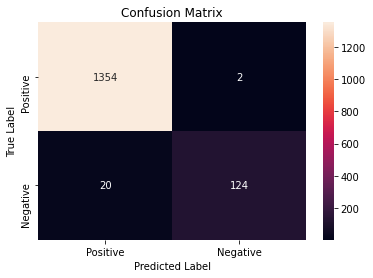

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Bagging Tree (Random Forest Classifier) Model"
print(sstr.center(120, '-')) 

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_bgr, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Bagging Tree (Random Forest Classifier) Model"
print(sstr.center(120, '-')) 

#Metrics

rc_bgr=recall_score(y_test,bgr_y_pred)
print ('Recall:', rc_bgr)

print('-'*120)

pr_bgr=precision_score(y_test,bgr_y_pred)
print ('Precision:', pr_bgr)

print('-'*120)

f1_bgr=f1_score(y_test,bgr_y_pred)
print ('F1 score:', f1_bgr)

print('-'*120)

roc_bgr=roc_auc_score(y_test,bgr_y_pred)
print ('Roc Auc Score:', roc_bgr)

print('-'*120)

test_bgr= metrics.accuracy_score(y_test, bgr_y_pred)
print ('Test Accuracy:', test_bgr)

print('-'*120)

train_bgr= bgr.score(X_train,y_train)
print ('Train Accuracy:', train_bgr)

print('-'*120)

kappa_bgr= metrics.cohen_kappa_score(y_test, bgr_y_pred)
print ('Kappa Score:', kappa_bgr)

print('-'*120)

mcc_bgr= metrics.matthews_corrcoef(y_test, bgr_y_pred)
print ('Matthews correlation coefficient :', mcc_bgr)

print('_'*120)

------------------------------Evaluation of Bagging Tree (Random Forest Classifier) Model-------------------------------
Recall: 0.8611111111111112
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9841269841269841
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9185185185185185
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9298180924287119
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9853333333333333
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9925714285714285
-------------------------------------------------------------------------------------

In [ ]:
j=pd.DataFrame({'Model':['Bagging Tree (RF=Gini)'],'Recall':rc_bgr,'Precision':pr_bgr,'F1 score':f1_bgr, 'AUC':roc_bgr,'Test Accuracy':test_bgr,'Train Accuracy': train_bgr,'Matthews Correlation Coefficient': mcc_bgr,'Kappa Score': kappa_bgr})
j

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Bagging Tree (RF=Gini),0.861111,0.984127,0.918519,0.929818,0.985333,0.992571,0.91295,0.910499


Extra Trees

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier 
ex=ExtraTreesClassifier(n_estimators=100, max_depth=14,max_samples=0.5,random_state=0)
ex.fit(X_train,y_train)
ex_y_pred = ex.predict(X_test)
ex_y_prob = ex.predict_proba(X_test)
ex_y_pred, ex_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[4.10000000e-02, 9.59000000e-01],
        [9.42000000e-01, 5.80000000e-02],
        [9.99230769e-01, 7.69230769e-04],
        ...,
        [1.00000000e+00, 0.00000000e+00],
        [9.88134776e-01, 1.18652243e-02],
        [9.79636364e-01, 2.03636364e-02]]))

In [ ]:
sstr = "Evaluation of Extra Tree Model"
print(sstr.center(120, '-')) 

#Classification Report
print(classification_report(y_test, ex_y_pred))

print('-'*120)

#Cross Validation
scores_ex = cross_val_score(ex, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_ex)

print('-'*120)

#Mean of each fold 
cross_ex= scores_ex.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_ex)

print('-'*120)

#Confusion Matrix
cm_ex = confusion_matrix(y_test, ex_y_pred)
print ('CM=',cm_ex)

print('-'*120)

#Roc curve
exprob=ex.predict_proba(X_test)
fpr11,tpr11,threshold11=roc_curve(y_test,exprob[:,1])
roc_auc11= metrics.auc(fpr11,tpr11)
print('ROC=',roc_auc11)


print('_'*120)

---------------------------------------------Evaluation of Extra Tree Model---------------------------------------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1356
           1       0.99      0.85      0.92       144

    accuracy                           0.99      1500
   macro avg       0.99      0.93      0.95      1500
weighted avg       0.99      0.99      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98571429 0.99142857 0.98       0.98       0.97714286 0.97142857
 0.97142857 0.97714286 0.98857143 0.98285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.05714285714286
------------------------------------------------------------------------------------------------------

----------------------------------------------------Extra Tree Model----------------------------------------------------


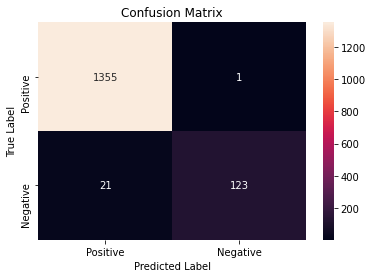

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Extra Tree Model"
print(sstr.center(120, '-')) 

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_ex, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of Extra Tree Model"
print(sstr.center(120, '-'))  

#Metrics
rc_ex=recall_score(y_test,ex_y_pred)
print('Recall:', rc_ex)

print('-'*120)

pr_ex=precision_score(y_test,ex_y_pred)
print('Precision:', pr_ex)

print('-'*120)

f1_ex=f1_score(y_test,ex_y_pred)
print ('F1 score:', f1_ex)

print('-'*120)

roc_ex=roc_auc_score(y_test,ex_y_pred)
print ('Roc Auc Score:', roc_ex)

print('-'*120)

test_ex= metrics.accuracy_score(y_test, ex_y_pred)
print ('Test Accuracy:', test_ex)

print('-'*120)

train_ex= ex.score(X_train,y_train)
print ('Train Accuracy:', train_ex)

print('-'*120)

kappa_ex= metrics.cohen_kappa_score(y_test, ex_y_pred)
print ('Kappa Score:', kappa_ex)

print('-'*120)

mcc_ex= metrics.matthews_corrcoef(y_test, ex_y_pred)
print ('Matthews correlation coefficient :', mcc_ex)

print('_'*120)

---------------------------------------------Evaluation of Extra Tree Model---------------------------------------------
Recall: 0.8541666666666666
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9919354838709677
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.917910447761194
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9267146017699115
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9853333333333333
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9994285714285714
--------------------------------------------------------------------------------------

In [ ]:
k=pd.DataFrame({'Model':['Extra Tree'],'Recall':rc_ex,'Precision':pr_ex,'F1 score':f1_ex, 'AUC':roc_ex,'Test Accuracy':test_ex,'Train Accuracy': train_ex,'Matthews Correlation Coefficient': mcc_ex,'Kappa Score': kappa_ex})
k

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Extra Tree,0.854167,0.991935,0.91791,0.926715,0.985333,0.999429,0.912974,0.909907


ADA Boosting

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
ada=AdaBoostClassifier(n_estimators=300,learning_rate=1,random_state=0)
ada.fit(X_train,y_train)
ada_y_pred = ada.predict(X_test)
ada_y_prob = ada.predict_proba(X_test)
ada_y_pred, ada_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[0.47076181, 0.52923819],
        [0.50723803, 0.49276197],
        [0.50218546, 0.49781454],
        ...,
        [0.53580303, 0.46419697],
        [0.53496878, 0.46503122],
        [0.53417454, 0.46582546]]))

In [ ]:
sstr = "Evaluation of ADA Boosted Model"
print(sstr.center(120, '-'))  

#Classification Report
print(classification_report(y_test, ada_y_pred))

print('-'*120)

#Cross Validation
scores_ada = cross_val_score(ada, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_ada)

print('-'*120)

#Mean of each fold 
cross_ada= scores_ada.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_ada)

print('-'*120)

#Confusion Matrix
cm_ada = confusion_matrix(y_test, ada_y_pred)
print ('CM=',cm_ada)

print('-'*120)

#Roc curve
adaprob=ada.predict_proba(X_test)
fpr12,tpr12,threshold12=roc_curve(y_test,adaprob[:,1])
roc_auc12= metrics.auc(fpr12,tpr12)
print('ROC=',roc_auc12)

print('_'*120)

--------------------------------------------Evaluation of ADA Boosted Model---------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1356
           1       0.90      0.83      0.87       144

    accuracy                           0.98      1500
   macro avg       0.94      0.91      0.93      1500
weighted avg       0.97      0.98      0.97      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.97714286 0.98       0.96857143 0.96285714 0.97142857 0.95428571
 0.95142857 0.98       0.97142857 0.96857143]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 96.85714285714285
------------------------------------------------------------------------------------------------------

---------------------------------------------------ADA Boosted Model----------------------------------------------------


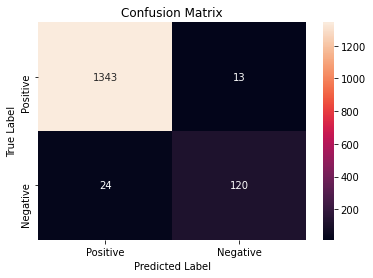

________________________________________________________________________________________________________________________


In [ ]:
sstr = "ADA Boosted Model"
print(sstr.center(120, '-'))  

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_ada, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
sstr = "Evaluation of ADA Boosted Model"
print(sstr.center(120, '-'))  

#Metrics

rc_ada=recall_score(y_test,ada_y_pred)
print('Recall:', rc_ada)

print('-'*120)

pr_ada=precision_score(y_test,ada_y_pred)
print('Precision:', pr_ada)

print('-'*120)

f1_ada=f1_score(y_test,ada_y_pred)
print('F1 score:', f1_ada)

print('-'*120)

roc_ada=roc_auc_score(y_test,ada_y_pred)
print('Roc Auc Score:', roc_ada)

print('-'*120)

test_ada= metrics.accuracy_score(y_test, ada_y_pred)
print('Test Accuracy:', test_ada)

print('-'*120)

train_ada= ada.score(X_train,y_train)
print('Train Accuracy:', train_ada)

print('-'*120)

kappa_ada= metrics.cohen_kappa_score(y_test, ada_y_pred)
print('Kappa Score:', kappa_ada)

print('-'*120)

mcc_ada= metrics.matthews_corrcoef(y_test, ada_y_pred)
print ('Matthews correlation coefficient :', mcc_ada)

print('_'*120)

--------------------------------------------Evaluation of ADA Boosted Model---------------------------------------------
Recall: 0.8333333333333334
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9022556390977443
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.8664259927797833
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.911873156342183
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9753333333333334
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9774285714285714
--------------------------------------------------------------------------------------

In [ ]:
l=pd.DataFrame({'Model':['ADA Boosting'],'Recall':rc_ada,'Precision':pr_ada,'F1 score':f1_ada, 'AUC':roc_ada,'Test Accuracy':test_ada,'Train Accuracy': train_ada,'Matthews Correlation Coefficient': mcc_ada,'Kappa Score': kappa_ada})
l

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,ADA Boosting,0.833333,0.902256,0.866426,0.911873,0.975333,0.977429,0.853679,0.852862


Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier(n_estimators=200,random_state=0)
gbc.fit(X_train,y_train)
gbc_y_pred = gbc.predict(X_test)
gbc_y_prob = gbc.predict_proba(X_test)
gbc_y_pred, gbc_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[1.21238092e-03, 9.98787619e-01],
        [9.95523625e-01, 4.47637547e-03],
        [9.99542386e-01, 4.57614420e-04],
        ...,
        [9.99924563e-01, 7.54372499e-05],
        [9.99779030e-01, 2.20969738e-04],
        [9.99923173e-01, 7.68267098e-05]]))

In [ ]:
sstr = "Evaluation of Gradient Boosted Model"
print(sstr.center(120, '-'))  


#Classification Report
print(classification_report(y_test, gbc_y_pred))

print('-'*120)

#Cross Validation
scores_gbc = cross_val_score(gbc, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_gbc)

print('-'*120)

#Mean of each fold 
cross_gbc= scores_gbc.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_gbc)

print('-'*120)

#Confusion Matrix
cm_gbc = confusion_matrix(y_test, gbc_y_pred)
print ('CM=',cm_gbc)

print('-'*120)

#Roc curve
gbcprob=gbc.predict_proba(X_test)
fpr13,tpr13,threshold13=roc_curve(y_test,gbcprob[:,1])
roc_auc13= metrics.auc(fpr13,tpr13)
print('ROC=',roc_auc13)

print('_'*120)


------------------------------------------Evaluation of Gradient Boosted Model------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.94      0.92      0.93       144

    accuracy                           0.99      1500
   macro avg       0.97      0.96      0.96      1500
weighted avg       0.99      0.99      0.99      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98571429 0.99714286 0.98285714 0.98285714 0.98       0.98571429
 0.98571429 0.98857143 0.99142857 0.99142857]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.7142857142857
-------------------------------------------------------------------------------------------------------

-------------------------------------------------Gradient Boosted Model-------------------------------------------------


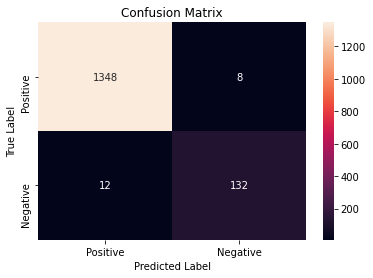

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Gradient Boosted Model"
print(sstr.center(120, '-'))  


# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_gbc, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('-'*120)

In [ ]:
sstr = "Evaluation of Gradient Boosted Model"
print(sstr.center(120, '-'))  


#Metrics

rc_gbc=recall_score(y_test,gbc_y_pred)
print('Recall:', rc_gbc)

print("-"*120)

pr_gbc=precision_score(y_test,gbc_y_pred)
print('Precision:', pr_gbc)

print("-"*120)

f1_gbc=f1_score(y_test,gbc_y_pred)
print('F1 score:', f1_gbc)

print("-"*120)

roc_gbc=roc_auc_score(y_test,gbc_y_pred)
print('Roc Auc Score:', roc_gbc)

print("-"*120)

test_gbc= metrics.accuracy_score(y_test, gbc_y_pred)
print ('Test Accuracy:', test_gbc)

print("-"*120)

train_gbc= gbc.score(X_train,y_train)
print ('Train Accuracy:', train_gbc)

print("-"*120)

kappa_gbc= metrics.cohen_kappa_score(y_test,gbc_y_pred)
print ('Kappa Score:', kappa_gbc)

print('-'*120)

mcc_gbc= metrics.matthews_corrcoef(y_test, gbc_y_pred)
print ('Matthews correlation coefficient :', mcc_gbc)

print("_"*120)

------------------------------------------Evaluation of Gradient Boosted Model------------------------------------------
Recall: 0.9166666666666666
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9428571428571428
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9295774647887323
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9553834808259587
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.9866666666666667
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9994285714285714
-------------------------------------------------------------------------------------

In [ ]:
m=pd.DataFrame({'Model':['Gradient Boosting'],'Recall':rc_gbc,'Precision':pr_gbc,'F1 score':f1_gbc, 'AUC':roc_gbc,'Test Accuracy':test_gbc,'Train Accuracy': train_gbc,'Matthews Correlation Coefficient': mcc_gbc,'Kappa Score': kappa_gbc})
m

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Gradient Boosting,0.916667,0.942857,0.929577,0.955383,0.986667,0.999429,0.922327,0.922215


XGB Boosting

In [ ]:
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
xgb=XGBClassifier(n_estimators=200,random_state=0)
xgb.fit(X_train,y_train)
xgb_y_pred = xgb.predict(X_test)
xgb_y_prob = xgb.predict_proba(X_test)
xgb_y_pred, xgb_y_prob

(array([1, 0, 0, ..., 0, 0, 0]), array([[3.9941669e-03, 9.9600583e-01],
        [9.9296671e-01, 7.0332759e-03],
        [9.9512696e-01, 4.8730373e-03],
        ...,
        [9.9992269e-01, 7.7302226e-05],
        [9.9975413e-01, 2.4584463e-04],
        [9.9995261e-01, 4.7363963e-05]], dtype=float32))

In [ ]:
sstr = "Evaluation of XGB Boosted Model"
print (sstr.center(120, '-'))  

#Classification Report
print(classification_report(y_test, xgb_y_pred))

print("-"*120)

#Cross Validation
scores_xgb = cross_val_score(xgb, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_xgb)

print("-"*120)

#Mean of each fold 
cross_xgb= scores_xgb.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_xgb)

print("-"*120)

#Confusion Matrix
cm_xgb = confusion_matrix(y_test, xgb_y_pred)
print('CM=',cm_xgb)


print("-"*120,)

#Roc curve
xgbprob=xgb.predict_proba(X_test)
fpr14,tpr14,threshold14=roc_curve(y_test,xgbprob[:,1])
roc_auc14= metrics.auc(fpr14,tpr14)
print('ROC=',roc_auc14)

print("-"*120)

--------------------------------------------Evaluation of XGB Boosted Model---------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1356
           1       0.94      0.92      0.93       144

    accuracy                           0.99      1500
   macro avg       0.96      0.96      0.96      1500
weighted avg       0.99      0.99      0.99      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.99142857 1.         0.98857143 0.98285714 0.98285714 0.97142857
 0.98571429 0.98571429 0.98857143 0.98285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 98.6
-------------------------------------------------------------------------------------------------------------------

---------------------------------------------------XGB Boosted Model----------------------------------------------------


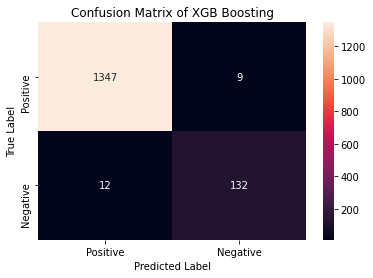

------------------------------------------------------------------------------------------------------------------------


In [ ]:
sstr = "XGB Boosted Model"
print (sstr.center(120, '-')) 

# Confusion Matrix
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_xgb, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix of XGB Boosting")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


print('-'*120)

In [ ]:
sstr = "Evaluation of XGB Boosted Model"
print (sstr.center(120, '-')) 

#Metrics
rc_xgb=recall_score(y_test,xgb_y_pred)
print('Recall:', rc_xgb)

print("-"*120)

pr_xgb=precision_score(y_test,xgb_y_pred)
print('Precision:', pr_xgb)

print("-"*120)

f1_xgb=f1_score(y_test,xgb_y_pred)
print('F1 score:', f1_xgb)

print("-"*120)

roc_xgb=roc_auc_score(y_test,xgb_y_pred)
print('Roc Auc Score:', roc_xgb)

print("-"*120)

test_xgb= metrics.accuracy_score(y_test, xgb_y_pred)
print ('Test Accuracy:', test_xgb)

print("-"*120)

train_xgb= xgb.score(X_train,y_train)
print ('Train Accuracy:', train_xgb)

print("-"*120)

kappa_xgb= metrics.cohen_kappa_score(y_test,xgb_y_pred)
print ('Kappa Score:', kappa_xgb )

print('-'*120)

mcc_xgb= metrics.matthews_corrcoef(y_test, xgb_y_pred)
print ('Matthews correlation coefficient :', mcc_xgb)

print("_"*120)

--------------------------------------------Evaluation of XGB Boosted Model---------------------------------------------
Recall: 0.9166666666666666
------------------------------------------------------------------------------------------------------------------------
Precision: 0.9361702127659575
------------------------------------------------------------------------------------------------------------------------
F1 score: 0.9263157894736843
------------------------------------------------------------------------------------------------------------------------
Roc Auc Score: 0.9550147492625368
------------------------------------------------------------------------------------------------------------------------
Test Accuracy: 0.986
------------------------------------------------------------------------------------------------------------------------
Train Accuracy: 0.9974285714285714
--------------------------------------------------------------------------------------------------

In [ ]:
n=pd.DataFrame({'Model':['XGB Boosting'],'Recall':rc_xgb,'Precision':pr_xgb,'F1 score':f1_xgb, 'AUC':roc_xgb,'Test Accuracy':test_xgb,'Train Accuracy': train_xgb,'Matthews Correlation Coefficient':mcc_xgb,'Kappa Score':kappa_xgb})
n

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,XGB Boosting,0.916667,0.93617,0.926316,0.955015,0.986,0.997429,0.918644,0.918582


Voting Classifier 

In [ ]:
from sklearn.ensemble import VotingClassifier
# Voting Classifier with hard voting 
vh = VotingClassifier([('LR',classifier),('DT', DT_classifier), ('RF',rfg_classifier),('KNN', knn_classifier), ('NB', nb_classifier), ('SVC', svm_classifier)], voting ='hard') 
vh.fit(X_train, y_train) 
vh_y_pred = vh.predict(X_test) 
print (vh_y_pred)

#Metrics
sstr = "Evaluation of Hard Voting Classifier"
print (sstr.center(120, '-'))  

#Classification Report
print(classification_report(y_test, vh_y_pred))

print('-'*120)

#Cross Validation
scores_vh = cross_val_score(vh, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_vh)

print('-'*120)

#Mean of each fold 
cross_vh= scores_vh.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_vh)

print('-'*120)

#Confusion Matrix
cm_vh = confusion_matrix(y_test, vh_y_pred)
print ('CM=',cm_vh)

print('-'*120)

#Recall
rc_vh=recall_score(y_test,vh_y_pred)
print ('Recall:', rc_vh)

print('-'*120)

#Precision
pr_vh=precision_score(y_test,vh_y_pred)
print ('Precision:', pr_vh)

print('-'*120)

#F1 Score
f1_vh=f1_score(y_test,vh_y_pred)
print ('F1 score:', f1_vh)

print('-'*120)

#ROC AUC Score
roc_vh=roc_auc_score(y_test,vh_y_pred)
print ('Roc Auc Score:', roc_vh)

print('-'*120)

#Test Accuracy
test_vh= metrics.accuracy_score(y_test, vh_y_pred)
print ('Test Accuracy:', test_vh)

print('-'*120)

#Train Accuracy
train_vh= vh.score(X_train,y_train)
print ('Train Accuracy:', train_vh)

print('-'*120)

#Kappa Value
kappa_vh= metrics.cohen_kappa_score(y_test,vh_y_pred)
print ('Kappa Score:', kappa_vh)

print('-'*120)

mcc_vh= metrics.matthews_corrcoef(y_test, vh_y_pred)
print ('Matthews correlation coefficient :', mcc_vh)

print("_"*120)

[1 0 0 ... 0 0 0]
------------------------------------------Evaluation of Hard Voting Classifier------------------------------------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1356
           1       0.99      0.77      0.87       144

    accuracy                           0.98      1500
   macro avg       0.98      0.89      0.93      1500
weighted avg       0.98      0.98      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.97428571 0.98       0.96285714 0.97428571 0.97142857 0.96857143
 0.97142857 0.96857143 0.98857143 0.97428571]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 97.34285714285716
------------------------------------------------------------------------------------

In [ ]:
# Voting Classifier with soft voting 
vs = VotingClassifier([('LR',classifier),('DT', DT_classifier),('RF', rfg_classifier),('KNN', knn_classifier), ('NB', nb_classifier), ('SVC', svm_classifier)], voting ='soft') 
vs.fit(X_train, y_train) 
vs_y_pred = vs.predict(X_test) 
print (vs_y_pred)


sstr = "Evaluation of Soft Voting"
print (sstr.center(120, '-'))  

#Metrics
#Classification Report
print(classification_report(y_test, vs_y_pred))

print('-'*120)

#Cross Validation
scores_vs = cross_val_score(vs, X_train, y_train, scoring = 'accuracy', cv=10)
print('Cross-Validation Accuracy Scores', scores_vs)

print('-'*120)

#Mean of each fold 
cross_vs= scores_vs.mean() * 100
print("Accuracy of Model with Cross Validation is:",cross_vs)

print('-'*120)

#Confusion Matrix
cm_vs = confusion_matrix(y_test, vs_y_pred)
print ('CM=',cm_vs)

print('-'*120)

#Roc curve
vsprob=vs.predict_proba(X_test)
fpr15,tpr15,threshold15=roc_curve(y_test,vsprob[:,1])
roc_auc15= metrics.auc(fpr15,tpr15)
print('ROC=',roc_auc15)

print('-'*120)

rc_vs=recall_score(y_test,vs_y_pred)
print ('Recall:', rc_vs)

print('-'*120)

pr_vs=precision_score(y_test,vs_y_pred)
print('Precision:', pr_vs)

print('-'*120)

f1_vs=f1_score(y_test,vs_y_pred)
print ('F1 score:', f1_vs)

print('-'*120)

roc_vs=roc_auc_score(y_test,vs_y_pred)
print ('Roc Auc Score:', roc_vs)

print('-'*120)

test_vs= metrics.accuracy_score(y_test, vs_y_pred)
print ('Test Accuracy:', test_vs)

print('-'*120)

train_vs= vs.score(X_train,y_train)
print ('Train Accuracy:', train_vs)

print('-'*120)

kappa_vs= metrics.cohen_kappa_score(y_test,vs_y_pred)
print ('Kappa Score:', kappa_vs)

print('-'*120)

mcc_vs= metrics.matthews_corrcoef(y_test, vs_y_pred)
print ('Matthews correlation coefficient :', mcc_vs)

print('_'*120)

[1 0 0 ... 0 0 0]
-----------------------------------------------Evaluation of Soft Voting------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1356
           1       0.98      0.85      0.91       144

    accuracy                           0.98      1500
   macro avg       0.98      0.92      0.95      1500
weighted avg       0.98      0.98      0.98      1500

------------------------------------------------------------------------------------------------------------------------
Cross-Validation Accuracy Scores [0.98571429 0.98571429 0.97142857 0.97714286 0.97714286 0.97142857
 0.97714286 0.97714286 0.98857143 0.98285714]
------------------------------------------------------------------------------------------------------------------------
Accuracy of Model with Cross Validation is: 97.94285714285714
------------------------------------------------------------------------------------

------------------------------------------------------Hard Voting-------------------------------------------------------


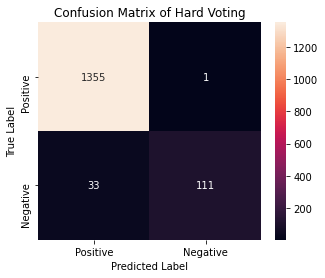

------------------------------------------------------Soft Voting-------------------------------------------------------


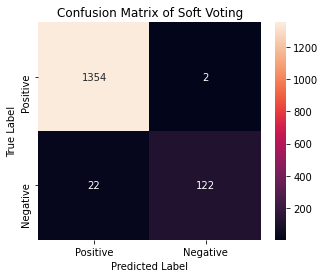

________________________________________________________________________________________________________________________


In [ ]:
sstr = "Hard Voting"
print (sstr.center(120, '-')) 

# Confusion Matrix
plt.figure(figsize= (5,4))
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_vh, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix of Hard Voting")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

sstr = "Soft Voting"
print (sstr.center(120, '-')) 

# Confusion Matrix
plt.figure(figsize= (5,4))
class_label = ["Positive", "Negative"]
df_cm = pd.DataFrame(cm_vs, index = class_label, columns = class_label)
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix of Soft Voting")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print('_'*120)

In [ ]:
o=pd.DataFrame({'Model':['Hard Voting Classifier'],'Recall':rc_vh,'Precision':pr_vh,'F1 score':f1_vh, 'AUC':roc_vh,'Test Accuracy':test_vh,'Train Accuracy': train_vh,'Matthews Correlation Coefficient': mcc_vh,'Kappa Score':kappa_vh})
o


,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Hard Voting Classifier,0.770833,0.991071,0.867188,0.885048,0.977333,0.980857,0.863082,0.855008


In [ ]:
p=pd.DataFrame({'Model':['Soft Voting Classifier'],'Recall':rc_vs,'Precision':pr_vs,'F1 score':f1_vs, 'AUC':roc_vs,'Test Accuracy':test_vs,'Train Accuracy': train_vs,'Matthews Correlation Coefficient': mcc_vs,'Kappa Score':kappa_vs})
p

,Model,Recall,Precision,F1 score,AUC,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Soft Voting Classifier,0.847222,0.983871,0.910448,0.922874,0.984,0.987143,0.904756,0.901717


**Comparing the models**

In [ ]:
s=pd.concat([a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p])
s=s.rename(columns={'AUC': 'ROC AUC Score'})
s

,Model,Recall,Precision,F1 score,ROC AUC Score,Test Accuracy,Train Accuracy,Matthews Correlation Coefficient,Kappa Score
0,Logistic Regression,0.652778,0.839286,0.734375,0.819752,0.954667,0.956857,0.716721,0.710016
0,Naive Bayes,0.534722,0.658120,0.590038,0.752612,0.928667,0.927714,0.554997,0.551430
0,KNN Classifier,0.680556,0.924528,0.784000,0.837328,0.964000,0.974857,0.775549,0.764858
0,Support Vector Machine,0.909722,0.935714,0.922535,0.951543,0.985333,0.988857,0.914548,0.914437
0,Decision Tree (Entropy),0.881944,0.927007,0.903915,0.937285,0.982000,0.987714,0.894329,0.893991
0,Decision Tree (Gini),0.881944,0.920290,0.900709,0.936916,0.981333,0.991714,0.890658,0.890413
0,Random Forest (Entropy),0.909722,0.956204,0.932384,0.952649,0.987333,0.999714,0.925751,0.925401
0,Random Forest (Gini),0.909722,0.984962,0.945848,0.954124,0.990000,0.999714,0.941250,0.940349
0,Bagging Tree (DT=Entropy),0.902778,0.928571,0.915493,0.947702,0.984000,0.996000,0.906768,0.906658
0,Bagging Tree (RF=Gini),0.861111,0.984127,0.918519,0.929818,0.985333,0.992571,0.912950,0.910499


In [ ]:
#Comparing the Built Models
model_names = []
models = [('LR',classifier),('NB', nb_classifier),('KNN', knn_classifier),('SVM', svm_classifier),('DT(E)', DT_classifier),('DT(G)', DTg_classifier),('RF(E)', rf_classifier),('RF(G)', rfg_classifier),('BT(DT)', bge),('BT(RF)',bgr), ('EX', ex),('ADA', ada), ('GB', gbc),('XGB', xgb), ('VH', vh), ('VS', vs) ] 
outcomes = []
names = []
scoring = 'accuracy'
for name, model in models:
	k_fold_validation = KFold(n_splits=10, random_state=0)
	cv_results = cross_val_score(model, x, y, cv=k_fold_validation, scoring=scoring)
	outcomes.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the n

LR: 0.952600 (0.009425)
NB: 0.938400 (0.007787)
KNN: 0.956800 (0.008588)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


SVM: 0.980000 (0.006132)
DT(E): 0.984800 (0.003600)
DT(G): 0.984400 (0.002653)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


RF(E): 0.986600 (0.003353)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


RF(G): 0.987400 (0.004386)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


BT(DT): 0.985200 (0.004665)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


BT(RF): 0.984800 (0.004214)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


EX: 0.984200 (0.002600)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


ADA: 0.970000 (0.005865)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


GB: 0.987000 (0.004123)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


XGB: 0.985800 (0.004238)


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


VH: 0.972400 (0.004800)


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the n

VS: 0.980400 (0.005987)


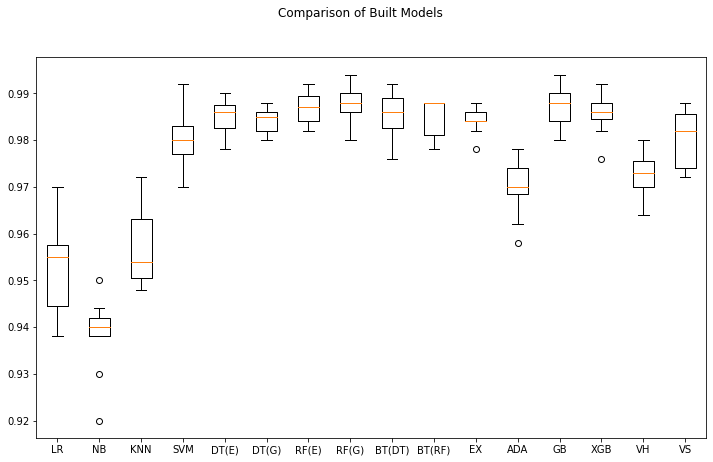

In [ ]:
#Plotting the comparison of built models 
fig = plt.figure(figsize=(12,7))
fig.suptitle('Comparison of Built Models')
ax = fig.add_subplot(111)
plt.boxplot(outcomes)
ax.set_xticklabels(names)
plt.show()

Inference from the comparison: Random Forest Classifier with Gini criterion (Gini Index) for splitting of trees exhibit high perfomance compared to other models.







**9) Business understanding of your model**

According to the data, only 9.6% of customers accepted the personal loan in the earlier campaign. This signifies imbalance in the data. 

1) Random Forest Classifier (Gini) model with highest Matthews Correlation Co-efficient value of 0.94125 indicates the perfect prediction of the model with reduced misprediction (or randomization). Since, the target variable "Personal Loan" is binary, this parameter is considered highly reliable. 

2) False Negative values (FN) = "Predicting members interested in Personal Loan as not interested". This count of FN is least in the Random Forest Classifier (Gini) model (refer confusion matrix). Similarly, False Positives are also less in Random Forest Classifier (Gini) model. This indicates better classification and less misinterpretation of the data than other models. 

3)Kappa value of 0.940349 of Random Forest Classifier (Gini) Model signifies good agreement of the expected accuracy with actual accuracy. Random Forest Classifier (Gini) Model has the highest kappa value out of others.

4)Random Forest Classifier (Gini) Model has highest F1 score of 0.945848 compared to other models. This indicates less prediction of False data (FP and FN). 

5) Recall value of 0.909722 and Precision value 0.984962 boosts the chocie of Random Forest Classifier (Gini) Model as best. The F1 score between these two metrics retrive best prediction of the model and Random Forest Classifier (Gini) Model suffices it.

5)ROC AUC Score of 0.954124 also denotes Random Forest Classifier (Gini) Model as good classifier. 

6)It also predicts the model with a test accuracy of 0.99 which is the highest of all. Since the given data is imbalanced, accuracy is not considered as the critical parameter. 

7)Random Forest classifier is good at handling imbalanced data by balancing the erros and it also detects the significant variables for better classification. The combination of many decision tress play a vital role in limiting overfitting and bias in prediction.


**Conclusion:**

As per the problem statement, the goal was to predict potential customers with "**higher probablity**" of purchasing Personal Loan.

**Random Forest Classifier (Gini) satisfies this goal. It highly reduces the False Negatives and precisely classifies the data given.** 


**Random Forest Tree Visualization**

In [ ]:
# Extracting tree
estimator = rfg_classifier.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [ ]:
# Converting to png 
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

In [ ]:
#Visualizing 
from IPython.display import Image
Image(filename = 'tree.png')